## PREDICT PATIENT SURVIVAL RATE USING DATA FROM FIRST 24HOURS OF INTENSIVE CARE

MIT's GOSSIS community initiative, with privacy certification from the Harvard Privacy Lab, has provided a dataset of more than 130,000 hospital Intensive Care Unit (ICU) visits from patients, spanning a one-year timeframe. This data is part of a growing global effort and consortium spanning Argentina, Australia, New Zealand, Sri Lanka, Brazil, and more than 200 hospitals in the United States.
___

### I.IMPORT LIBRARIES

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objs as go
from plotly import tools
import matplotlib.pyplot as plt
sns.set(style="whitegrid")
%matplotlib inline

import datetime, warnings, scipy 
from scipy.stats import pearsonr
import matplotlib as mpl
import matplotlib.patches as patches
from matplotlib.patches import ConnectionPatch
from collections import OrderedDict
from matplotlib.gridspec import GridSpec
from scipy.optimize import curve_fit
from collections import Counter
plt.rcParams["patch.force_edgecolor"] = True
plt.style.use('fivethirtyeight')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"

import missingno as msno

# warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Set standard parameters
pd.options.display.float_format = '{:.1f}'.format
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', -1)

In [3]:
from google.colab import drive
drive.mount("/content/drive/", force_remount=True)
!ls "/content/drive/My Drive"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/
Deep_Learning_Project  Healthcare  ML_Project


In [0]:
# !pip install tf-nightly-gpu-2.0-preview

In [0]:
# import tensorflow as tf
# device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#   raise SystemError('GPU not found')
# print('Found GPU at :{}'.format(device_name))

### II.IMPORT DATA

In [0]:
df = pd.read_csv('/content/drive/My Drive/Healthcare/Data/training_v2.csv', low_memory = False)
dictionary = pd.read_csv('/content/drive/My Drive/Healthcare/Data/WiDS Datathon 2020 Dictionary.csv')

In [0]:
df.head(2)

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.7,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.5,0,73.9,2.3,113.0,502.0,0,0.0,0.4,31.0,2.5,nan,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,nan,nan,nan,nan,36.0,134.0,39.3,nan,0.0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,nan,nan,68.0,63.0,68.0,63.0,119.0,108.0,nan,nan,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,nan,nan,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.5,2.2,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,nan,nan,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.1,0.1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.4,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.9,0,70.2,nan,108.0,203.0,0,0.0,n

___
### III.FUCTIONS

In [0]:
def check_missing_df(df):
    # look at how many missing values for the columns
    missing_values_count= df.isnull().sum()
    missing_values_percentage=np.round(df.isnull().sum()/df.shape[0]*100,2)

    #show it in dataframe
    data = {'Number_missing':missing_values_count, 'Missing_percentage':missing_values_percentage} 
    
    # Create DataFrame 
    missing_info = pd.DataFrame(data) 
    
    # Print the output. 
    display(missing_info.sort_values('Missing_percentage',ascending = False))

In [0]:
def plot_by_target(cols):
    fig, ax = plt.subplots(2, 2, figsize=(12, 7))

    X=[]
    for (i,j) in zip(cols[:2],cols[2:]):
        ax1 = sns.distplot(target_0[i], hist=True, kde=True, ax = ax[1][0])
        ax2 = sns.distplot(target_1[i], hist=True, kde=True, ax = ax[0][0])
        ax3 = sns.distplot(target_0[j], hist=True, kde=True, ax = ax[1][1])
        ax4 = sns.distplot(target_1[j], hist=True, kde=True, ax = ax[0][1])
        x_max = df[cols].describe()[7:].max(axis = 1)[0] + 1
        x_min = df[cols].describe()[3:4].min(axis = 1)[0] - 1
        X.extend([h.get_height() for h in ax1.patches])
        X.extend([h.get_height() for h in ax2.patches])
        X.extend([h.get_height() for h in ax3.patches])
        X.extend([h.get_height() for h in ax4.patches])
        ax[0][1].legend(['max','min'])
        y_max = max(X)
        ax1.set_xlim([x_min, x_max])
        ax2.set_xlim([x_min, x_max])
        ax3.set_xlim([x_min, x_max])
        ax4.set_xlim([x_min, x_max])
        ax1.set_ylim([0, y_max])
        ax2.set_ylim([0, y_max])
        ax3.set_ylim([0, y_max])
        ax4.set_ylim([0, y_max])
        ax1.set_xlabel("")
        ax2.set_xlabel("")
        ax3.set_xlabel("")
        ax4.set_xlabel("")
        ax1.set_title(i[:-4]+"_survived")
        ax2.set_title(i[:-4]+"_death")
        ax3.set_title(j[:-4]+"_survived")
        ax4.set_title(j[:-4]+"_death")

In [0]:
def plot_distribution(df, var, target, **kwargs):
    row = kwargs.get('row', None)
    col = kwargs.get('col', None)
    facet = sns.FacetGrid(df, hue=target, aspect=4, row = row, col = col )
    facet.map(sns.kdeplot, var, shade= True )
    facet.set(xlim=(df[var].min(), df[var].max()))
    facet.add_legend()

___
### Dictionary

Learn more about the measurements: 

https://www.anzics.com.au/wp-content/uploads/2018/08/ANZICS-APD-Data-Dictionary.pdf

In [8]:
X=pd.DataFrame(dictionary.T.head(6))
X.columns=list(X.loc[X.index == 'Variable Name'].unstack())
X = X.loc[X.index != 'Variable Name']
df_dictionary = pd.DataFrame(df.describe())
df_dictionary = pd.concat([X,df_dictionary],axis=0)
df_dictionary.head(15)

,age,aids,albumin_apache,apache_2_bodysystem,apache_2_diagnosis,apache_3j_bodysystem,apache_3j_diagnosis,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,apache_post_operative,arf_apache,bilirubin_apache,bmi,bun_apache,cirrhosis,creatinine_apache,d1_albumin_max,d1_albumin_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_heartrate_max,d1_heartrate_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_resprate_max,d1_resprate_min,d1_sodium_max,d1_sodium_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,d1_wbc_max,d1_wbc_min,diabetes_mellitus,elective_surgery,encounter_id,ethnicity,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,gender,glucose_apache,h1_albumin_max,h1_albumin_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_heartrate_max,h1_heartrate_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_resprate_max,h1_resprate_min,h1_sodium_max,h1_sodium_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,h1_wbc_max,h1_wbc_min,heart_rate_apache,height,hematocrit_apache,hepatic_failure,hospital_admit_source,hospital_death,hospital_id,icu_admit_source,icu_admit_type,icu_id,icu_stay_type,icu_type,immunosuppression,intubated_apache,leukemia,lymphoma,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,patient_id,ph_apache,pre_icu_los_days,pred,readmission_status,resprate_apache,sodium_apache,solid_tumor_with_metastasis,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,weight
Category,demographic,APACHE comorbidity,APACHE covariate,APACHE grouping,APACHE covariate,APACHE grouping,APACHE covariate,APACHE prediction,APACHE prediction,APACHE covariate,APACHE covariate,APACHE covariate,demographic,APACHE covariate,APACHE comorbidity,APACHE covariate,labs,labs,labs blood gas,labs blood gas,labs blood gas,labs blood gas,labs blood gas,labs blood gas,labs,labs,labs,labs,labs,labs,labs,labs,vitals,vitals,vitals,vitals,vitals,vitals,labs,labs,labs,labs,vitals,vitals,labs,labs,labs,labs,labs,labs,labs,labs,vitals,vitals,vitals,vitals,vitals,vitals,labs blood gas,labs blood gas,labs,labs,labs,labs,vitals,vitals,labs,labs,vitals,vitals,vitals,vitals,vitals,vitals,vitals,vitals,vitals,vitals,labs,labs,APACHE comorbidity,demographic,identifier,demographic,APACHE covariate,APACHE covariate,APACHE covariate,APACHE covariate,APACHE covariate,demographic,APACHE covariate,labs,labs,labs blood gas,labs blood gas,labs blood gas,labs blood gas

In [10]:
# Transpose dictionary
df_dictionary.T.head(20)

,Category,Unit of Measure,Data Type,Description,Example,count,mean,std,min,25%,50%,75%,max
age,demographic,Years,numeric,The age of the patient on unit admission,None,87485.0,62.3,16.8,16.0,52.0,65.0,75.0,89.0
aids,APACHE comorbidity,None,binary,Whether the patient has a definitive diagnosis of acquired immune deficiency syndrome (AIDS) (not HIV positive alone),1,90998.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
albumin_apache,APACHE covariate,g/L,numeric,The albumin concentration measured during the first 24 hours which results in the highest APACHE III score,30,37334.0,2.9,0.7,1.2,2.4,2.9,3.4,4.6
apache_2_bodysystem,APACHE grouping,None,string,Admission diagnosis group for APACHE II,Respiratory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
apache_2_diagnosis,APACHE covariate,None,string,The APACHE II diagnosis for the ICU admission,308,90051.0,185.4,86.1,101.0,113.0,122.0,301.0,308.0
apache_3j_bodysystem,APACHE grouping,None,string,Admission diagnosis group for APACHE III,Cardiovascular,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
apache_3j_diagnosis,APACHE covariate,None,string,The APACHE III-J sub-diagnosis code which best describes the reason for the ICU admission,1405,90612.0,558.2,463.3,0.0,203.0,409.0,703.0,2201.1
apache_4a_hospital_death_prob,APACHE prediction,None,numeric,"The APACHE IVa probabilistic prediction of in-hospital mortality for the patient which utilizes the APACHE III score and other covariates, including diagnosis.",0.31,83766.0,0.1,0.2,-1.0,0.0,0.1,0.1,1.0
apache_4a_icu_death_prob,APACHE prediction,None,numeric,"The APACHE IVa probabilistic prediction of in ICU mortality for the patient which utilizes the APACHE III score and other covariates, including diagnosis",0.24,83766.0,0.0,0.2,-1.0,0.0,0.0,0.1,1.0
apache_post_operative,APACHE covariate,None,binary,"The APACHE operative status; 1 for post-operative, 0 for non-operative",1,91713.0,0.2,0.4,0.0,0.0,0.0,0.0,1.0


In [0]:
# Category within dictionary
dictionary.Category.unique()

array(['identifier', 'demographic', 'APACHE covariate', 'vitals', 'labs',
       'labs blood gas', 'APACHE prediction', 'APACHE comorbidity',
       'APACHE grouping', 'GOSSIS example prediction'], dtype=object)

In [0]:
dictionary[dictionary['Category']=='identifier']

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,None,integer,Unique identifier associated with a patient unit stay,None
1,identifier,hospital_id,None,integer,Unique identifier associated with a hospital,None
2,identifier,patient_id,None,integer,Unique identifier associated with a patient,None


___
__KEY NOTES:__

|CATEGORY| NOTES|
|--|--|
|GOSSIS example prediction | drop, just an example of prediction provided
|identifier | `counter_id`, `patient_id`, `hospital_id`. Check out `hospital_id` since the death_rate is different by hospital. However, should not bring it to modeling (model biased)
|labs, vitals, labs blood gas| We have both 24hrs and 1st hour measurements, however, higher percentage of missing values belong to 1st hours measurement features (80% missing)
|APACHE prediction| 2 feautures: probabilistic prediction of *in-hospital* and *ICU* **mortality**
|APACHE comorbidity| Binary (8 columns) | Whether the patient has been diagnosed with a specific ailment or not: AIDS, cirrhosis, diabetes_mellitus, hepatic_failure, immunosupression, leukemia, lyphoma, solid tumor with metastasis
|APACHE grouping | Read in detailed
|APACHE coveriate | Read in detailed



___
### III. CHECKING MISSING VALUES

All of the maps below represent the missing values using missingo package. The correlation map lets you know which features are missing together.

In [0]:
check_missing_df(df)

,Number_missing,Missing_percentage
h1_bilirubin_min,84619,92.3
h1_bilirubin_max,84619,92.3
h1_lactate_max,84369,92.0
h1_lactate_min,84369,92.0
h1_albumin_max,83824,91.4
h1_albumin_min,83824,91.4
h1_pao2fio2ratio_min,80195,87.4
h1_pao2fio2ratio_max,80195,87.4
h1_arterial_ph_max,76424,83.3
h1_arterial_ph_min,76424,83.3


__KEY NOTES__

|CATEOGRY| NOTES|
|--|--|
|demographic |`bmi`,`height`, and `weight` are often missing together. Check `hospital_admi_source` ( higher % if missing values)
|APACHE covariate| high % of missing values for these features: `albumin_apche`, `bilirubin_apache`, `fio2_apache`, `paco2_apache`, `paco2_for_ph_apache`, `pao2_apache`, `ph_apache`, `urineoutput_apache`.GO DEEPDIVE INTO THOSE FEATURES
|vitals | anything with `invasive` are missing a lot of values. The rest can be imputed. Homework: Check how noninvasive, invasive and normal measurements are different. Can we use one of them instead?
|labs| most of data within 1 hours admitted are missing >> plot the difference bt 1st hr and 24hrs, diff bt max and min value, should vary by features. Check out `inr`,`lactate`,`albumin`, and `bilirubin`, a lot of missing values, even using 24hours results.
|labs blood gas | Check how importance these features are. Most of them are missing. 
|APACHE prediction | if one of the 2 features has missing values, the other also has missing values
|APACHE comorbidity| very few missing value. Can be imputed
|APACHE grouping |  `apache2_bodysystem` and `apache3_bodysystem` are missing together. Check out what is the difference bt these two. Should only keep one of them in modeling

APACHE covariate


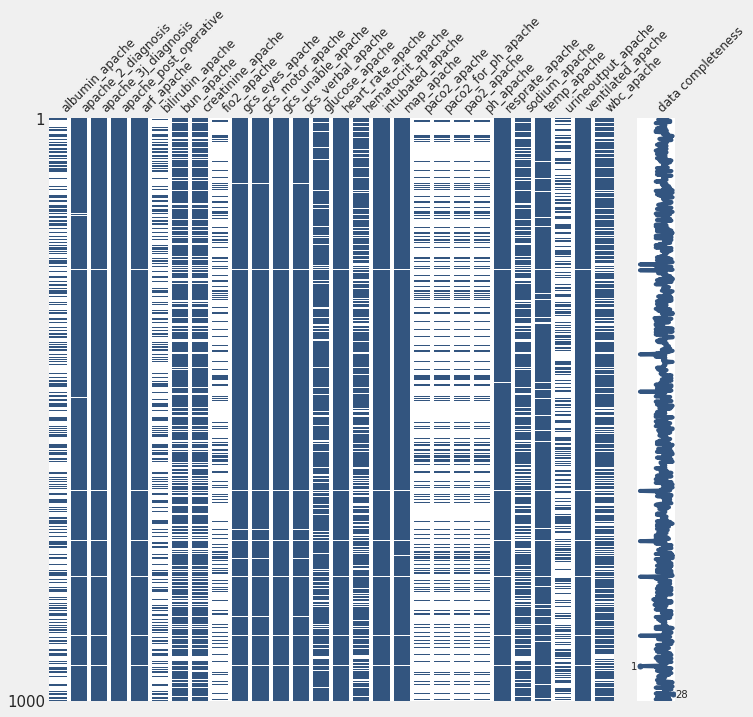

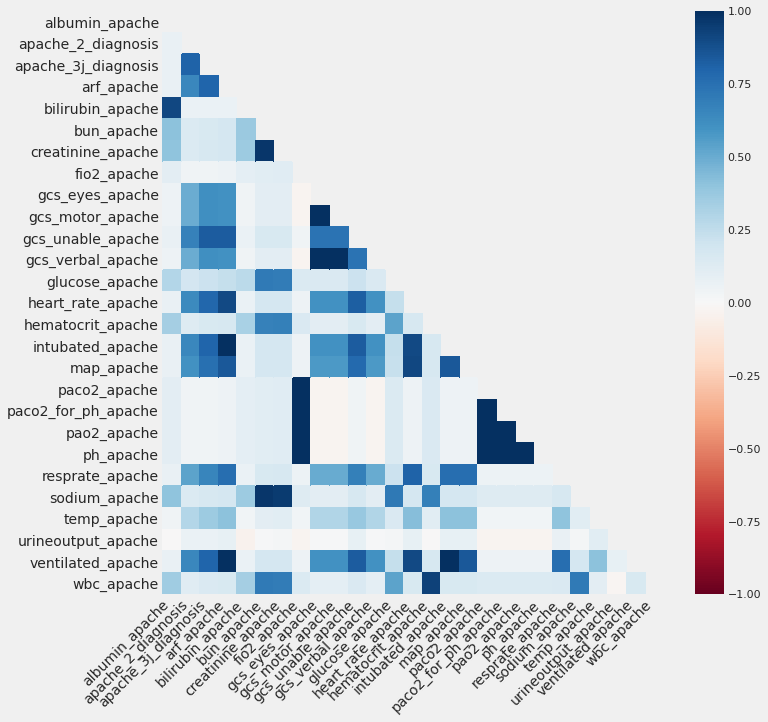

labs


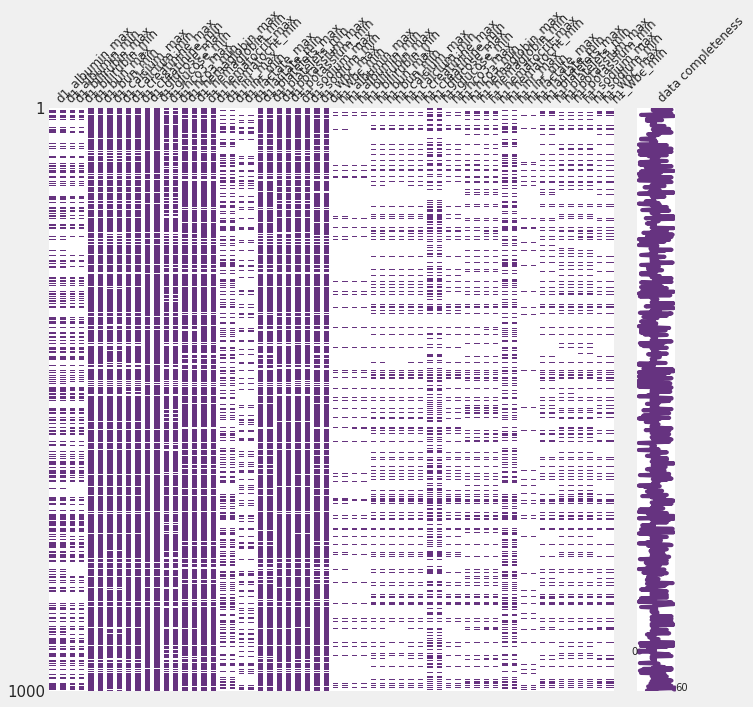

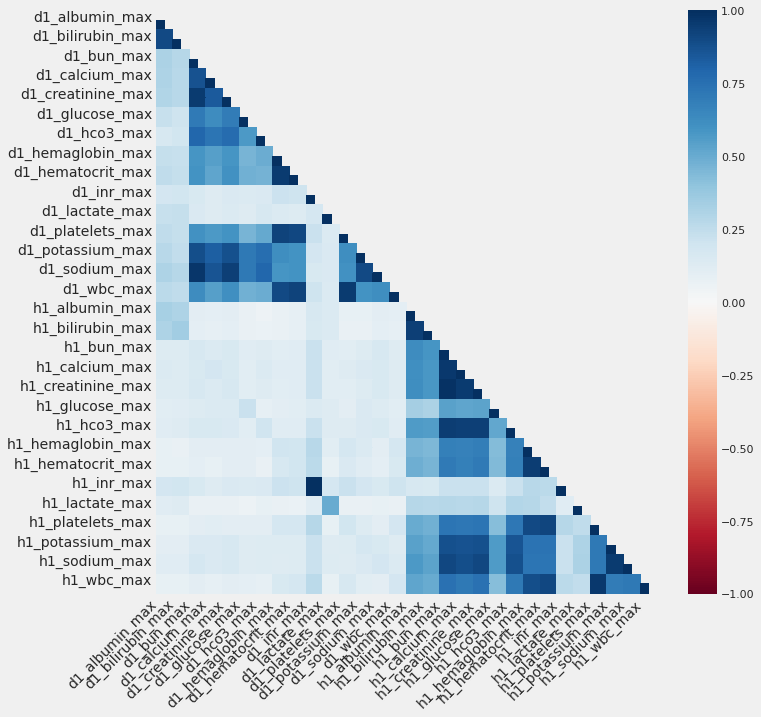

labs blood gas


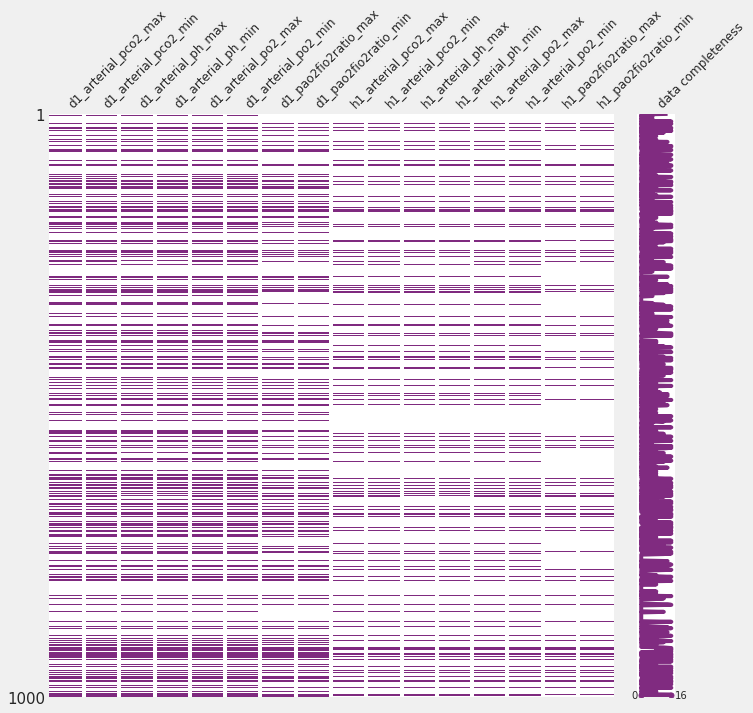

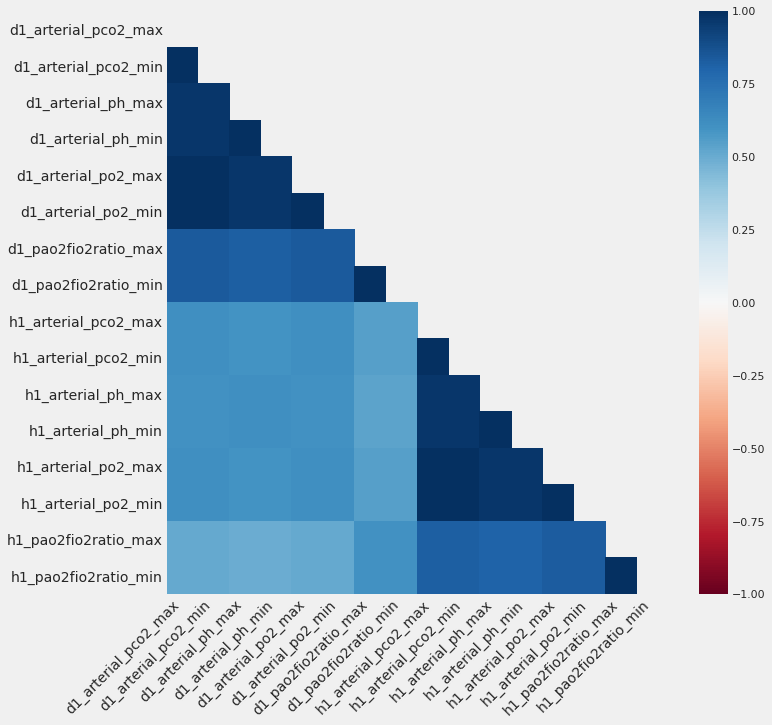

In [11]:
for color, variable in enumerate(dictionary['Category'].unique()):
  if variable not in ['GOSSIS example prediction','identifier',  'demographic', 'APACHE prediction', 'vitals', 'APACHE grouping', 'APACHE comorbidity']:
    print(variable)
    col_list = list(dictionary[dictionary['Category']==variable]['Variable Name'].values)
    col_list = [i for i in col_list if i in df.columns]
    if len(col_list) > 0:
        msno.matrix(df[col_list].sample(1000),figsize=(10, 10), labels=True, color=(color/10, 1/(color+1), 0.5),  fontsize=12)
        msno.heatmap(df[col_list],figsize=(10, 10),labels=False,fontsize=14)
        plt.show()

___
### IV.EXPLORATORY DATA ANALYSIS


____
#### 2.Lab Analysis

KEY KINDINGS:

- All of h1 features have missing values > 50%. We can not just impute by mean or median. 

 - Most of feaures in labs measurements do not show a big difference between max and min values, bt death and survived, except for:
    - glucose: lower tail
    - wbc: upper tail
    - platelets: lower tail
    - arterial: lower tail

 - The results also suggest that we should have two different ways to treat and use labs features vs. vitals features, which we will find out later in notebook 1C.Part3. There is a huge gap between max and min values and different distribution pattern between people who actually died vs. survived!

 - Since most of the apache measurements are using based on the actual same feature >> there is a high correlation bt apache and max | min value. As a result, apache score can be imputed by either max or min ( based on extreme value, distribution plot, and actual apache score system)

- Initial thought: 
 - Should look at the fluctuation bt h1 max_min and 1st hr vs. 24hrs.
 - Check whether patients with higher number of missing features have higher chance of survival. This may be because the physicians do not think these patients are severed enough to other a lot of test.

____

In [0]:
subset =dictionary[dictionary.Category=='labs']['Variable Name'].to_list()+dictionary[dictionary.Category=='labs blood gas']['Variable Name'].to_list()

#adding target variable
subset =subset+['hospital_death','patient_id','hospital_id']

#subset the data
df_lab =df[subset]

- h1 stands for the lab results from first 1 hour
- d1 stands for the lab results from first 24 hour

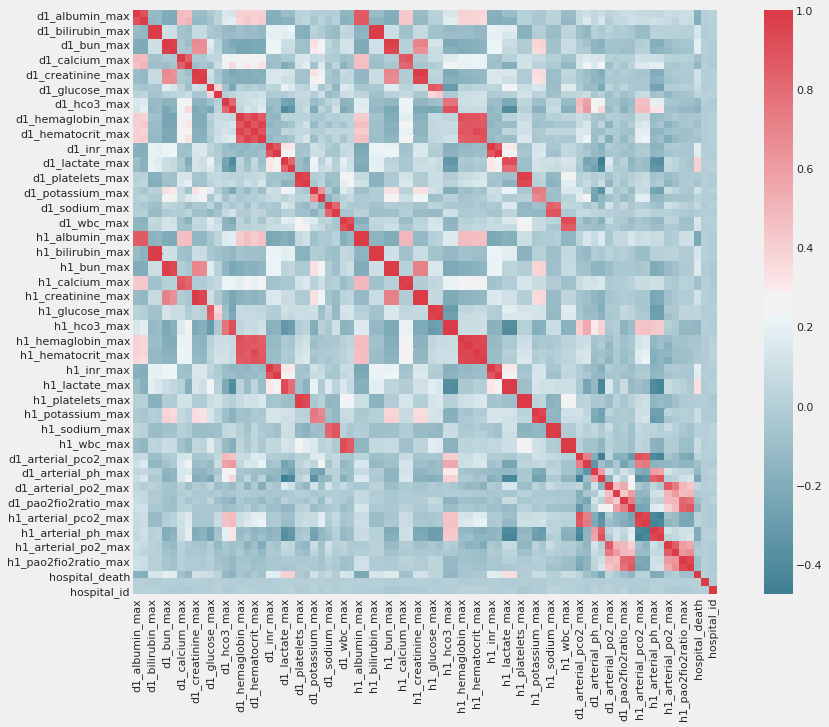

In [0]:
#heat map to check the correlation
f, ax = plt.subplots(figsize=(15, 10))
corr = df_lab.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

In [0]:
check_missing_df(df_lab)

,Number_missing,Missing_percentage
h1_bilirubin_min,84619,92.3
h1_bilirubin_max,84619,92.3
h1_lactate_min,84369,92.0
h1_lactate_max,84369,92.0
h1_albumin_max,83824,91.4
h1_albumin_min,83824,91.4
h1_pao2fio2ratio_min,80195,87.4
h1_pao2fio2ratio_max,80195,87.4
h1_arterial_ph_min,76424,83.3
h1_arterial_ph_max,76424,83.3


- All Variables above shows different distribution between people who survived and dealth.
- People who died ususally have less value based for all measurements show above
- hemaglboin: min max; hematocrit: min max; shows similar distribution for survival and death compare to other measurements

___
#### albumin
albumin is a protein made by your liver. Low albumin levels can indicate a problem with your liver or kidneys.

'albumin_apache':
 - missing value: 59.3%
 - The albumin concentration measured during the first 24 hours which results in the highest `APACHE III` score

Missing Data: 
  - 1 hour: 91.4% missing
  - 24 hour:53.5% missing
___

In [0]:
target_0 = df.loc[df['hospital_death'] == 0]
target_1 = df.loc[df['hospital_death'] == 1]

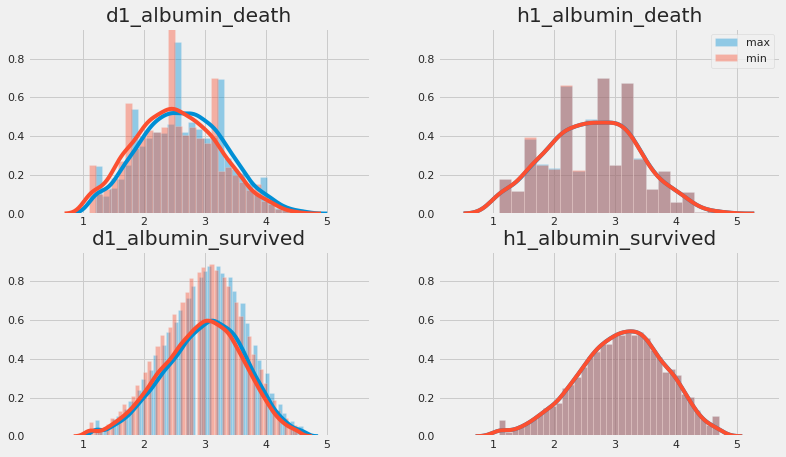

In [0]:
albumin=['d1_albumin_max','d1_albumin_min','h1_albumin_max','h1_albumin_min']
plot_by_target(albumin)

###### albumin_apache

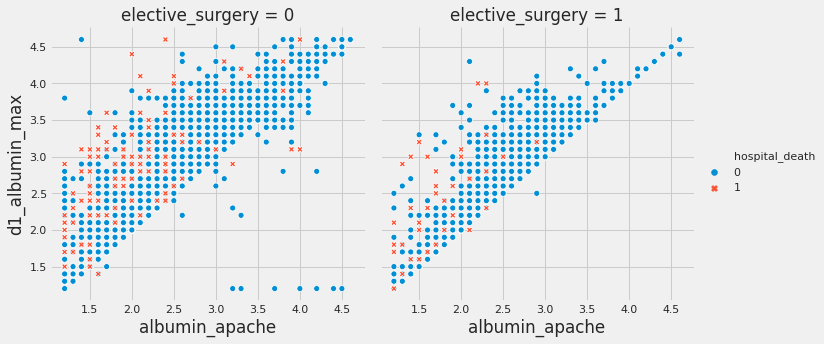

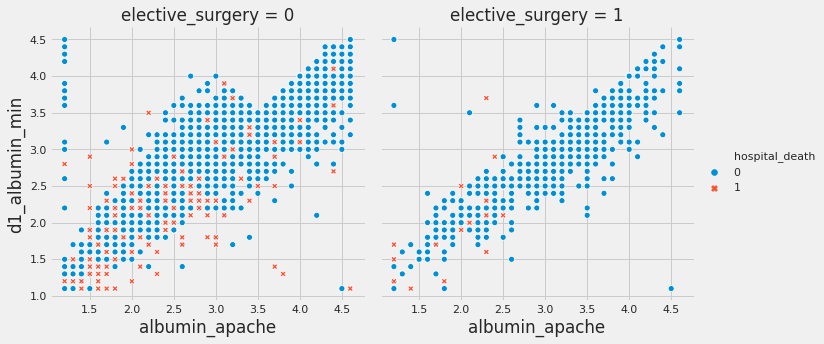

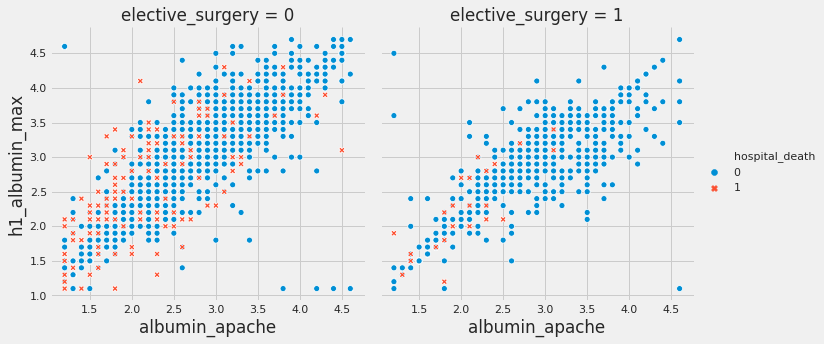

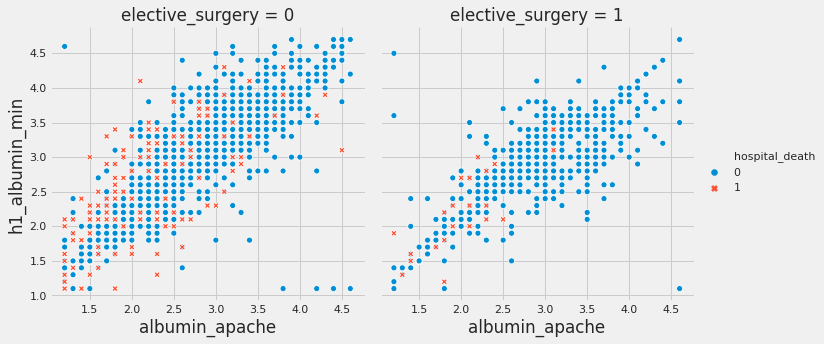

In [0]:
for i in albumin:
  sns.relplot(x="albumin_apache", y=i,col="elective_surgery", hue="hospital_death", style="hospital_death",kind="scatter", data=df)

___
#### bilirubin
Elevated levels may indicate liver damage or disease. Higher than normal levels of direct bilirubin in your blood may indicate your liver isn't clearing bilirubin properly.

bilirubin_apache:
 - Missing values: 63.4%
 - The bilirubin concentration measured during the first 24 hours which results in the highest APACHE III score

Missing values: 
 - 1h: 92.3%
 - 24h: 52.5%
___

plot with hospital 
apache_3j_bodysystem
apache_2_bodysystem


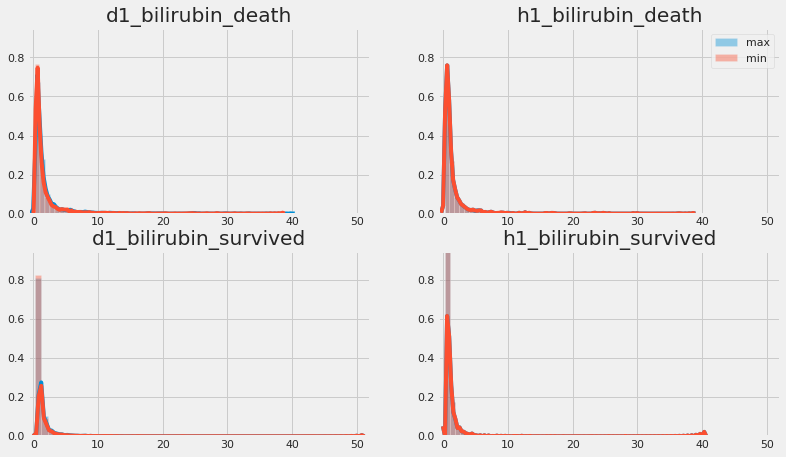

In [0]:
bilirubin=['d1_bilirubin_max','d1_bilirubin_min','h1_bilirubin_max','h1_bilirubin_min']
plot_by_target(bilirubin)

###### bilirubin_apache

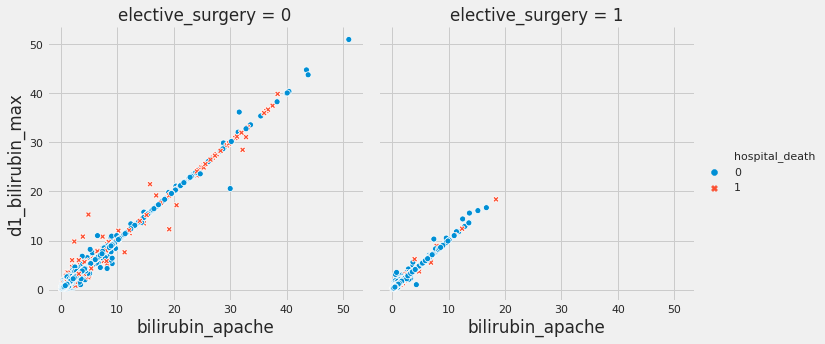

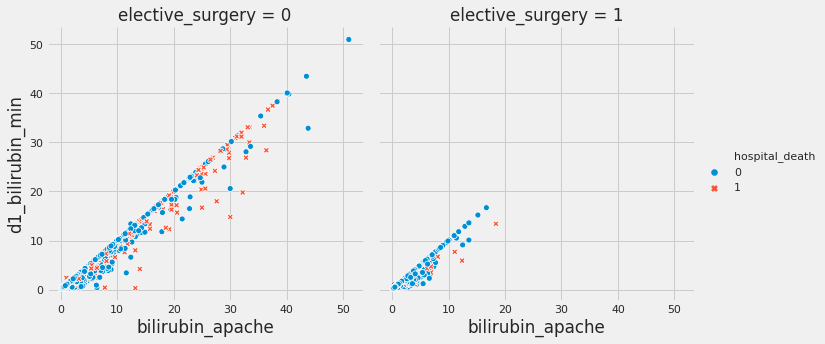

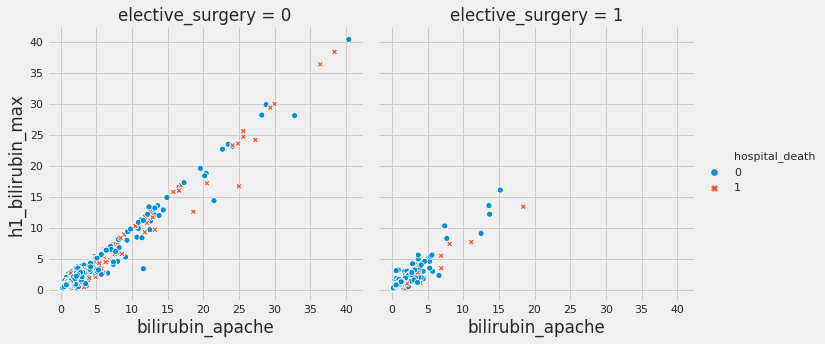

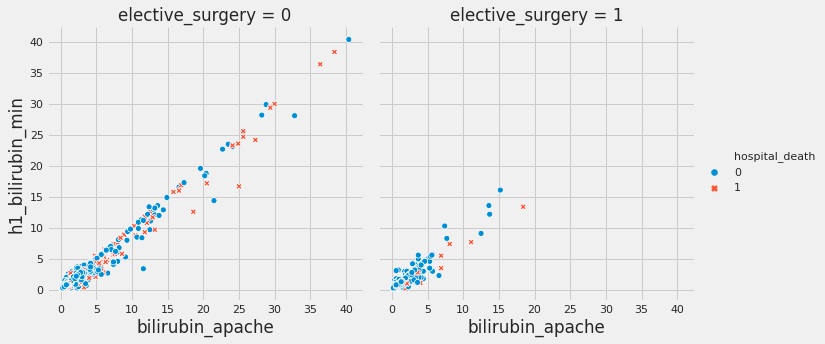

In [0]:
for i in bilirubin:
  sns.relplot(x="bilirubin_apache", y=i,col="elective_surgery", hue="hospital_death", style="hospital_death",kind="scatter", data=df)

___
#### bun
The normal BUN level is between about 7 and 21 milligrams per deciliter (mg/dL). Unless this level is greater than 60 mg/dL, it may not help your healthcare provider measure your kidney health

Missing values:
 - 1h: 81.9%
 - 24: 52.5%

___

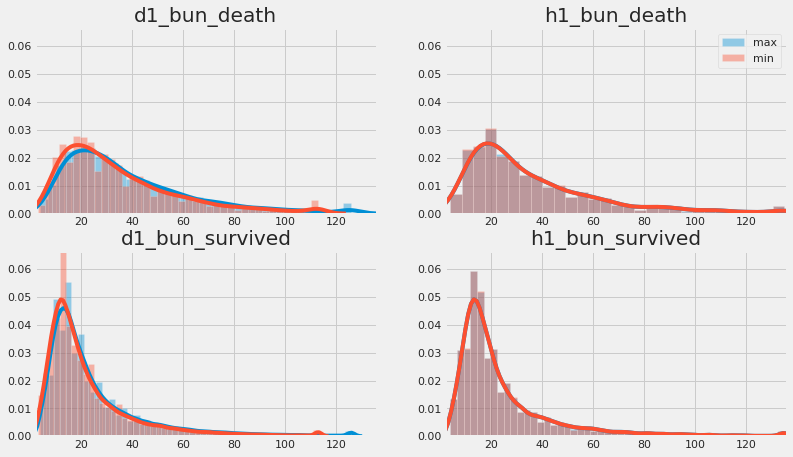

In [0]:
bun=['d1_bun_max','d1_bun_min','h1_bun_max','h1_bun_min']
plot_by_target(bun)

___
##### bun_apache


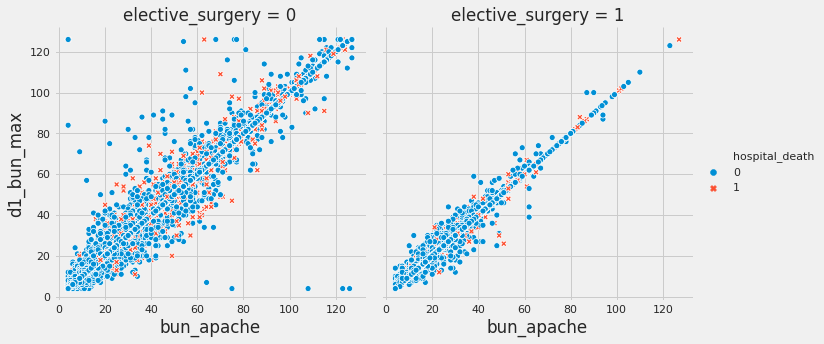

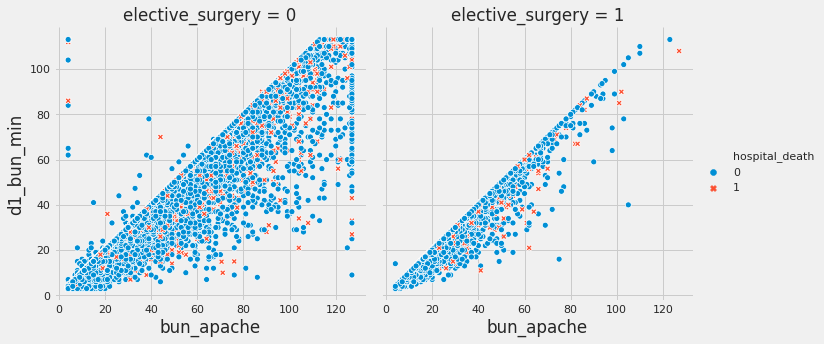

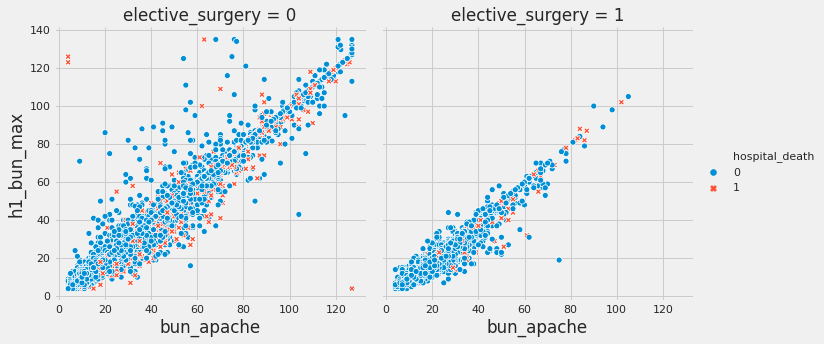

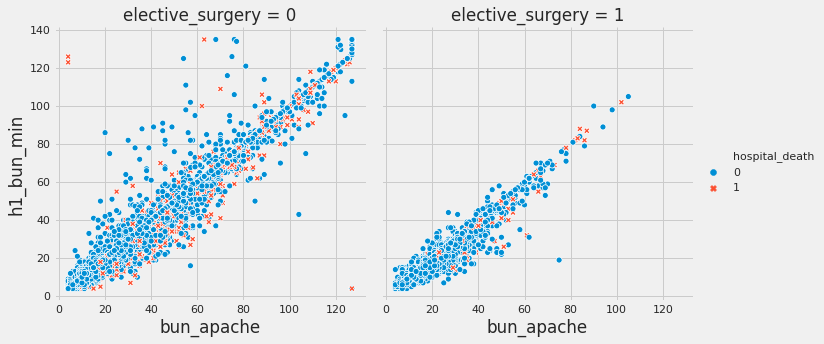

In [0]:
for i in bun:
  sns.relplot(x="bun_apache", y=i,col="elective_surgery", hue="hospital_death", style="hospital_death",kind="scatter", data=df)

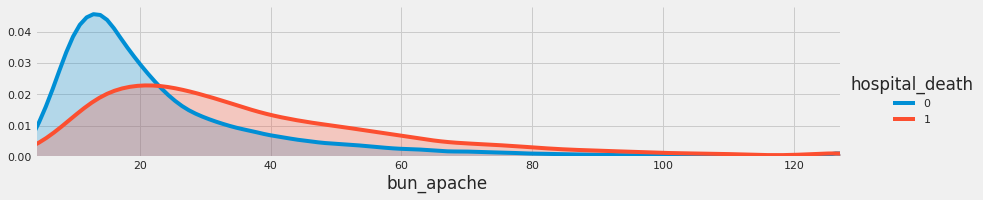

In [0]:
plot_distribution(df,var="bun_apache", target="hospital_death")

___
#### calcium
Normal blood calcium results in adults are: Total blood calcium: 8.5 to 10.3 milligrams per deciliter (mg/dL) Ionized calcium: 4.4 to 5.4 mg/dl

Missing values:
 - 1h: 82.7%
 - 24: 14.2%
___

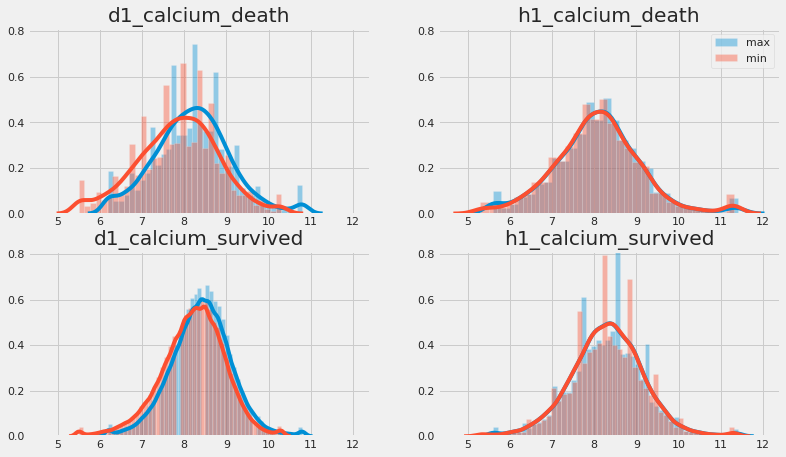

In [0]:
calcium=['d1_calcium_max','d1_calcium_min','h1_calcium_max','h1_calcium_min']
plot_by_target(calcium)

___
#### creatinine
Levels of creatinine in the blood reflect both the amount of muscle a person has and their amount of kidney function. Most men with normal kidney function have approximately 0.6 to 1.2 milligrams/deciliters (mg/dL) of creatinine.

Missing values:
 - 1h: 81.7%
 - 24: 11.1%

___

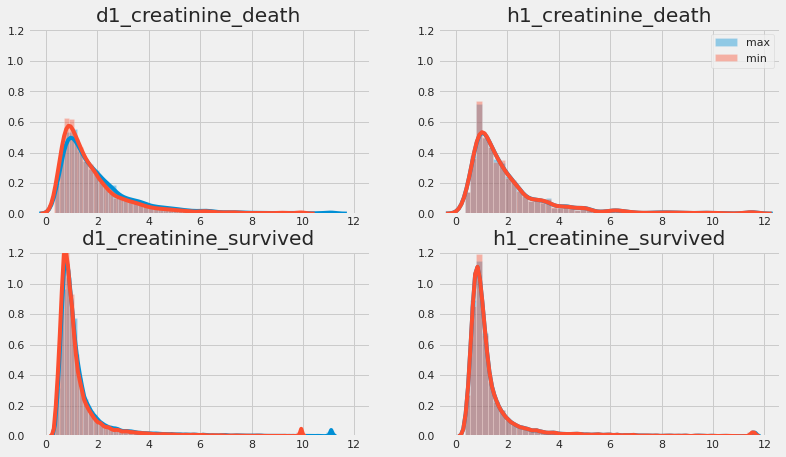

In [0]:
creatinine=['d1_creatinine_max','d1_creatinine_min','h1_creatinine_max','h1_creatinine_min']
plot_by_target(creatinine)

##### creatinine_apache
* creatinine_apache: The creatinine concentration measured during the first 24 hours which results in the highest APACHE III score

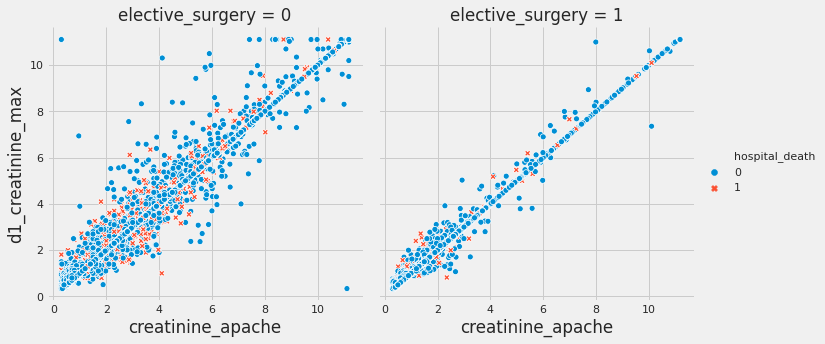

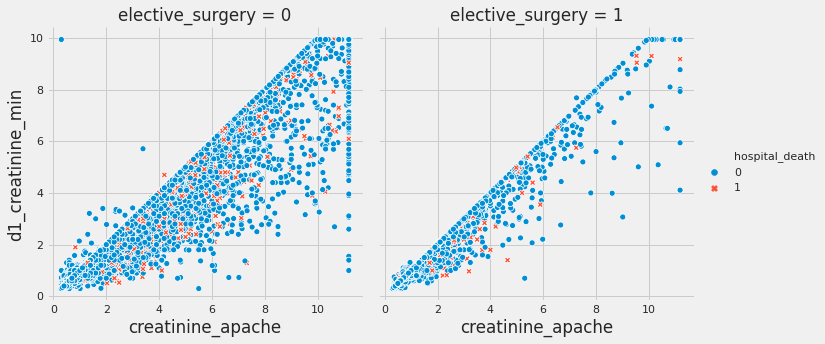

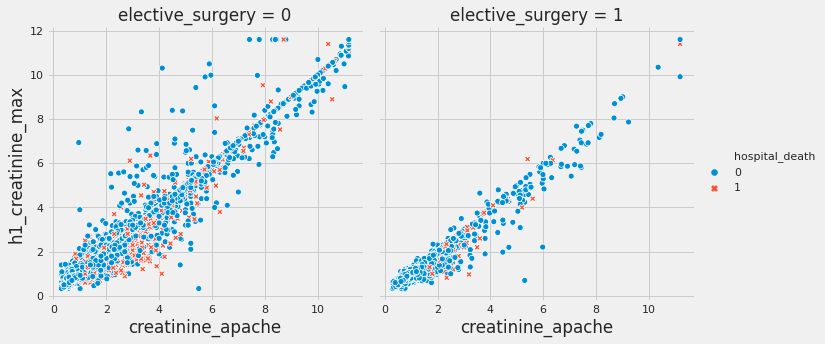

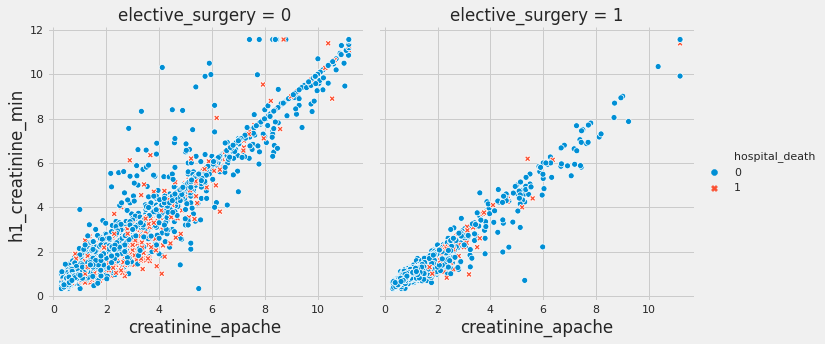

In [0]:
for i in creatinine:
  sns.relplot(x="creatinine_apache", y=i, col = "elective_surgery",hue="hospital_death", style="hospital_death",kind="scatter", data=df)

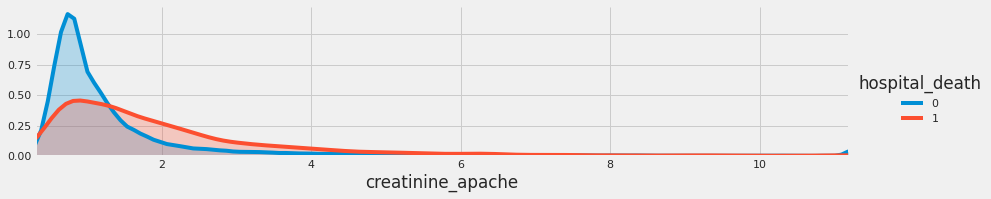

In [0]:
plot_distribution(df,var="creatinine_apache", target="hospital_death")

___
#### glucose
Normal blood sugar levels are less than 100 mg/dL after not eating (fasting) for at least eight hours. And they're less than 140 mg/dL two hours after eating. During the day, levels tend to be at their lowest just before meals.

Missing values:
 - 1h: 57.4%
 - 24: 6.3%

___

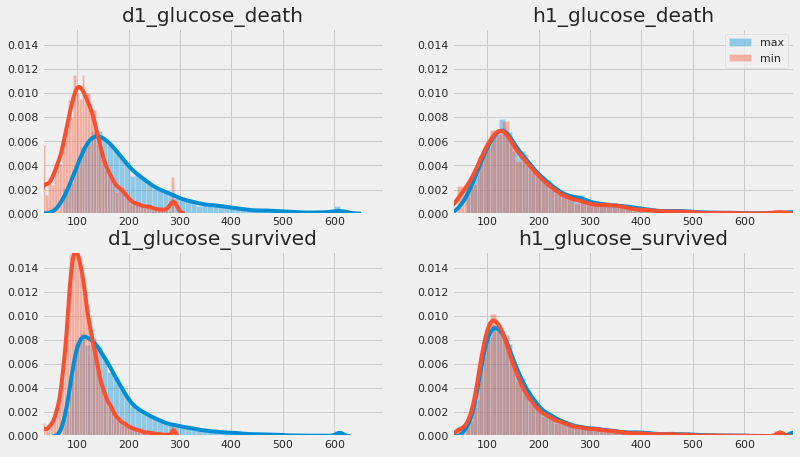

In [0]:
glucose=['d1_glucose_max','d1_glucose_min','h1_glucose_max','h1_glucose_min']
plot_by_target(glucose)

##### glucose_apache

- glucose_apache: The glucose concentration measured during the first 24 hours which results in the highest APACHE III score

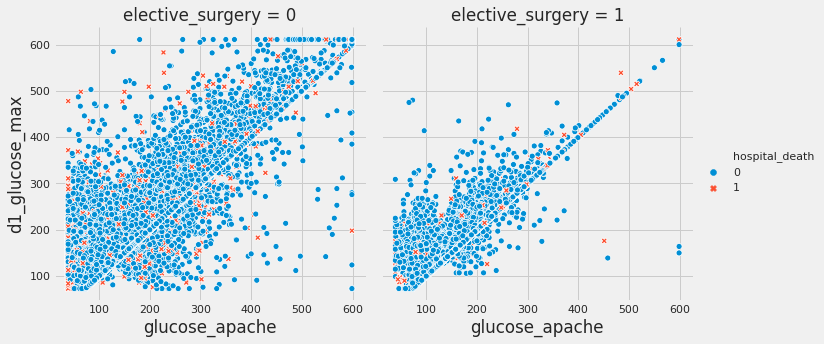

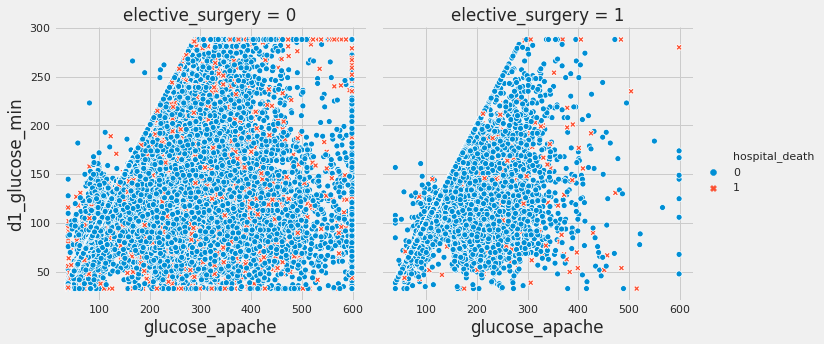

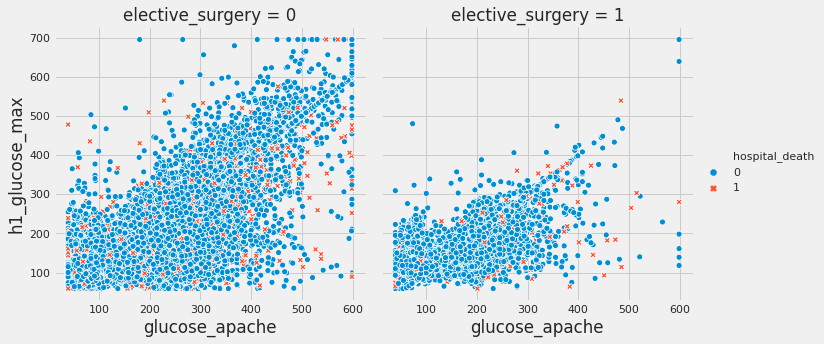

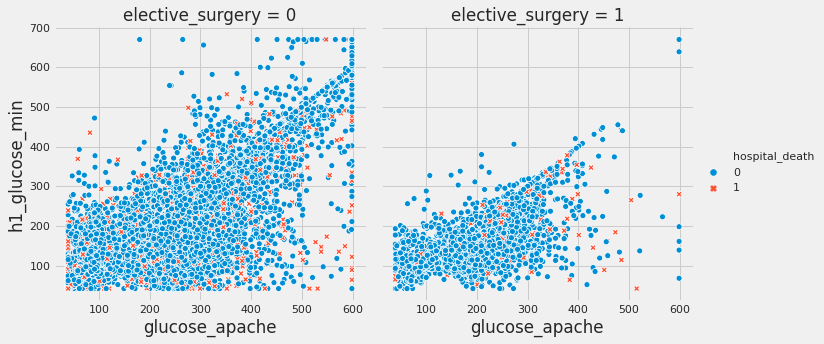

In [0]:
for i in glucose:
  sns.relplot(x="glucose_apache", y=i, col = "elective_surgery",hue="hospital_death", style="hospital_death",kind="scatter", data=df)

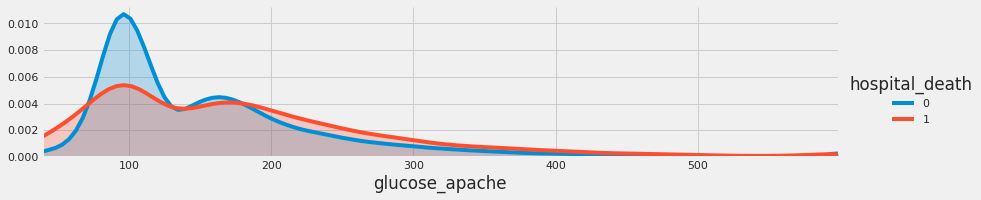

In [0]:
plot_distribution(df,var="glucose_apache", target="hospital_death")

___
#### hco3
A high level of bicarbonate in your blood can be from metabolic alkalosis, a condition that causes a pH increase in tissue. Metabolic alkalosis can happen from a loss of acid from your body, such as through vomiting and dehydration.

Missing values:
 - 1h: 83.0%
 - 24: 16.4%
___

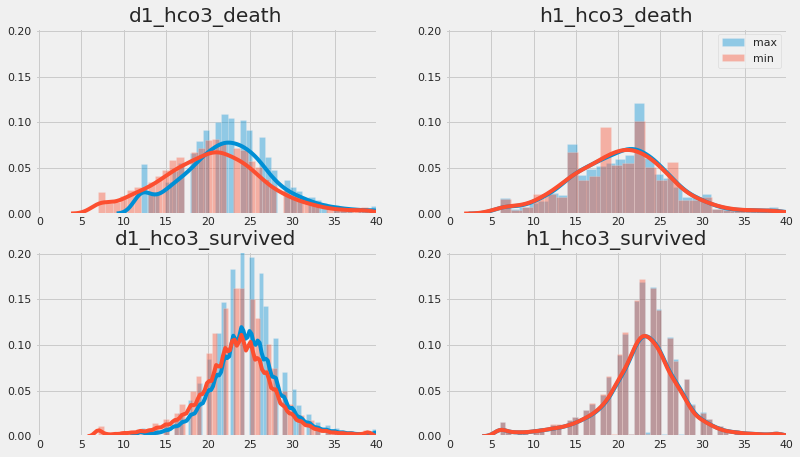

In [0]:
hco3=['d1_hco3_max','d1_hco3_min','h1_hco3_max','h1_hco3_min']
plot_by_target(hco3)

___
#### hemaglobin
The normal range for hemoglobin is: For men, 13.5 to 17.5 grams per deciliter. For women, 12.0 to 15.5 grams per deciliter.

Missing values:
 - 1h: 79.7%
 - 24: 13.2%
___

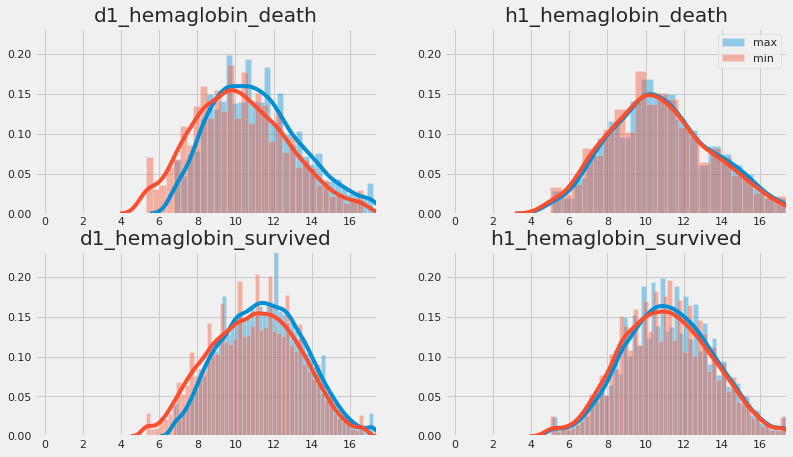

In [0]:
hemaglobin=['d1_hemaglobin_max','d1_hemaglobin_min','h1_hemaglobin_max','h1_hemaglobin_min']
plot_by_target(hemaglobin)

___
#### hematocrit
This is the ratio of the volume of red cells to the volume of whole blood. Normal range for hematocrit is different between the sexes and is approximately 45% to 52% for men and 37% to 48% for women.

Missing values:
 - 1h: 80.0%
 - 24: 12.7%
___

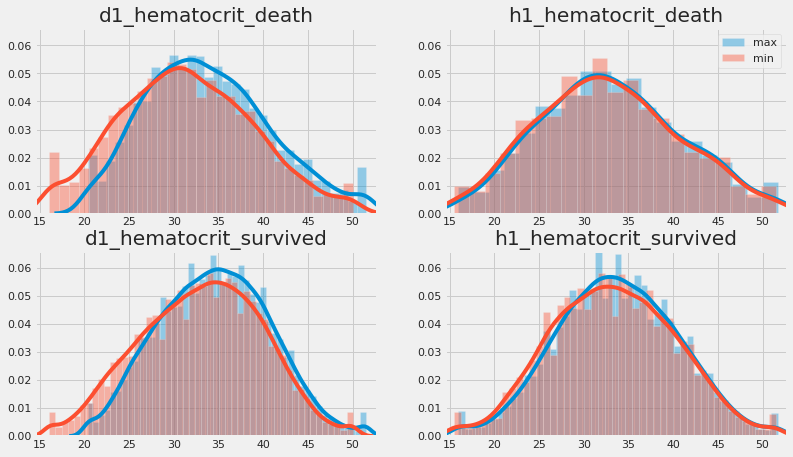

In [0]:
hematocrit=['d1_hematocrit_max','d1_hematocrit_min','h1_hematocrit_max','h1_hematocrit_min']
plot_by_target(hematocrit)

##### hematocrit_apache
* hematocrit_apache: The hematocrit measured during the first 24 hours which results in the highest APACHE III score

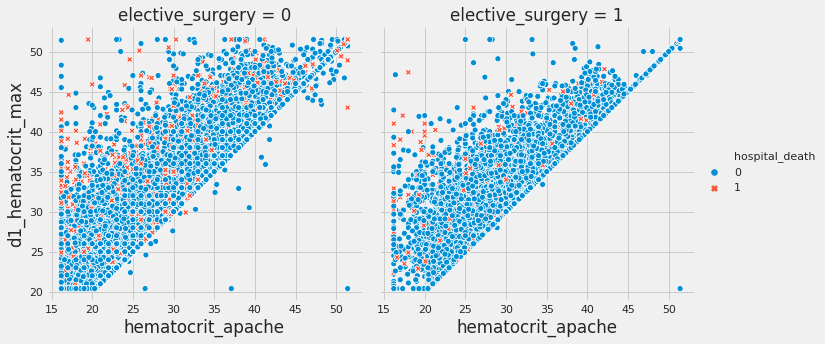

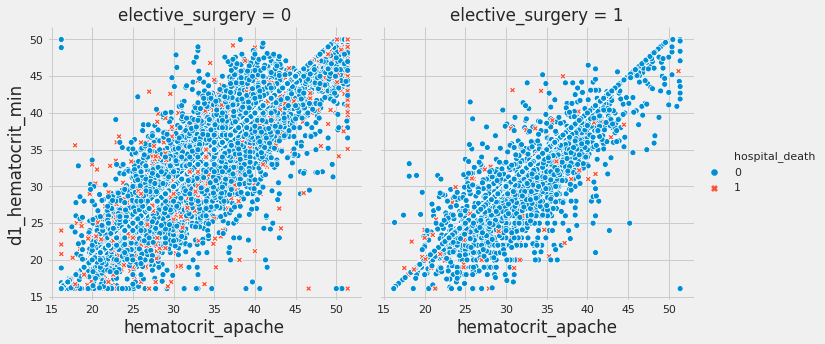

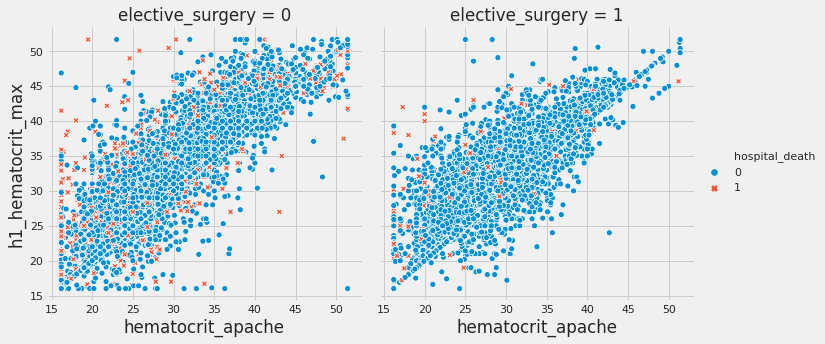

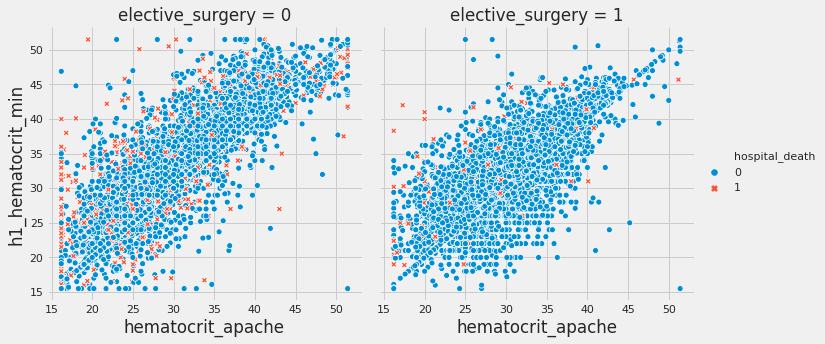

In [0]:
for i in hematocrit:
  sns.relplot(x="hematocrit_apache", y=i, col = "elective_surgery",hue="hospital_death", style="hospital_death",kind="scatter", data=df)

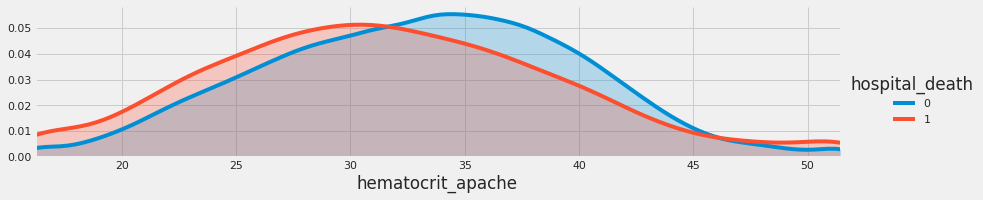

In [0]:
plot_distribution(df,var="hematocrit_apache", target="hospital_death")

___
#### inr
In healthy people an INR of 1.1 or below is considered normal. An INR range of 2.0 to 3.0 is generally an effective therapeutic range for people taking warfarin for disorders such as atrial fibrillation or a blood clot in the leg or lung.

Missing values:
 - 1h: 63.2%
 - 24: 63.2%
___

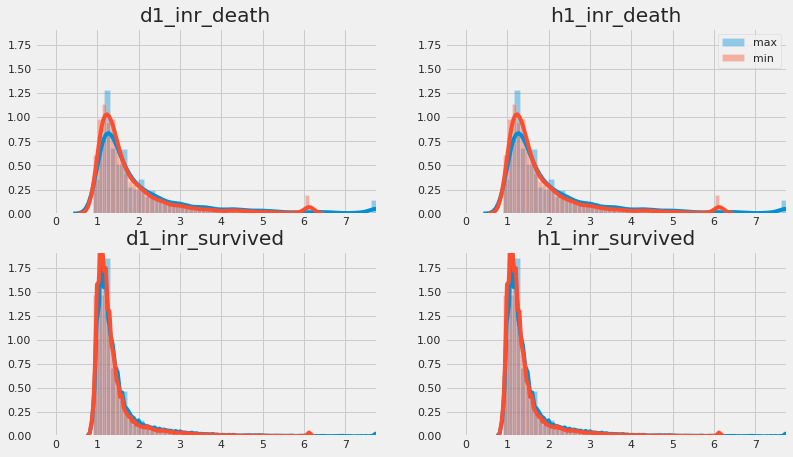

In [0]:
inr=['d1_inr_max','d1_inr_min','h1_inr_max','h1_inr_min']
plot_by_target(inr)

___
#### lactate
A normal blood lactate level is 0.5-1 mmol/L. Hyperlactatemia is defined as a persistent, mild to moderately elevated (2-4 mmol/L) lactate level without metabolic acidosis. This can occur with adequate tissue perfusion and tissue oxygenation
___

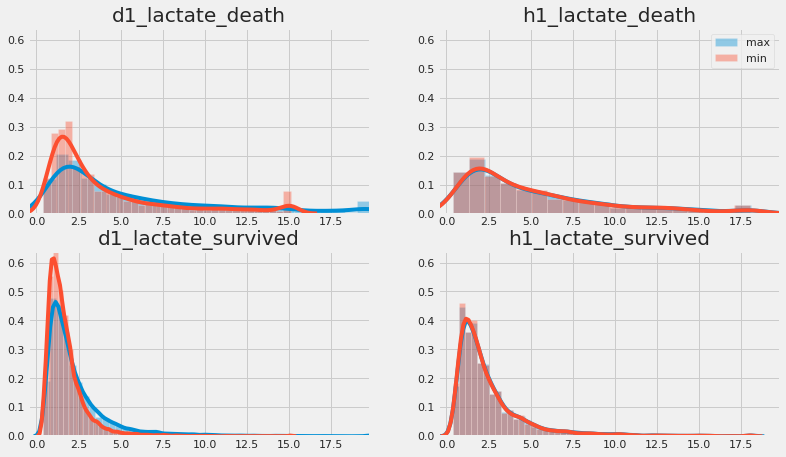

In [0]:
lactate=['d1_lactate_max','d1_lactate_min','h1_lactate_max','h1_lactate_min']
plot_by_target(lactate)

___
#### platelets
___

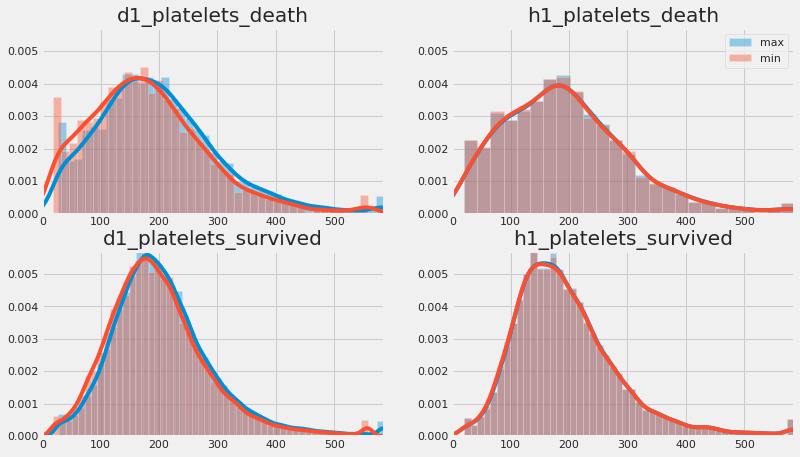

In [0]:
platelets=['d1_platelets_max','d1_platelets_min','h1_platelets_max','h1_platelets_min']
plot_by_target(platelets)

___
#### potassium
___

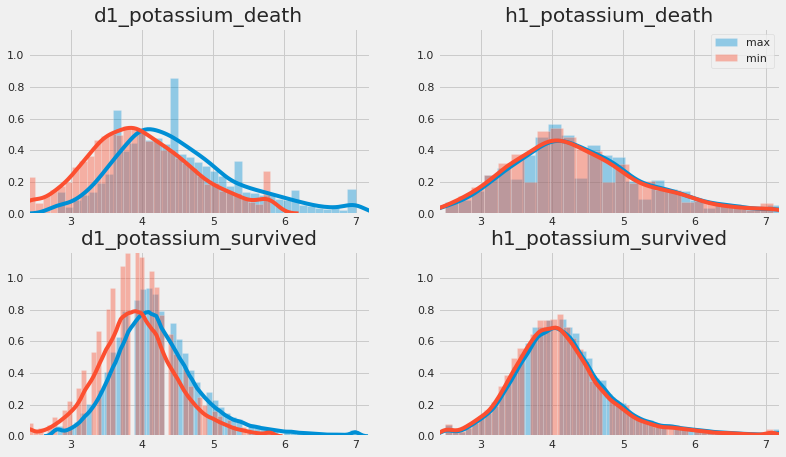

In [0]:
potassium=['d1_potassium_max','d1_potassium_min','h1_potassium_max','h1_potassium_min']
plot_by_target(potassium)

___
#### sodium
___

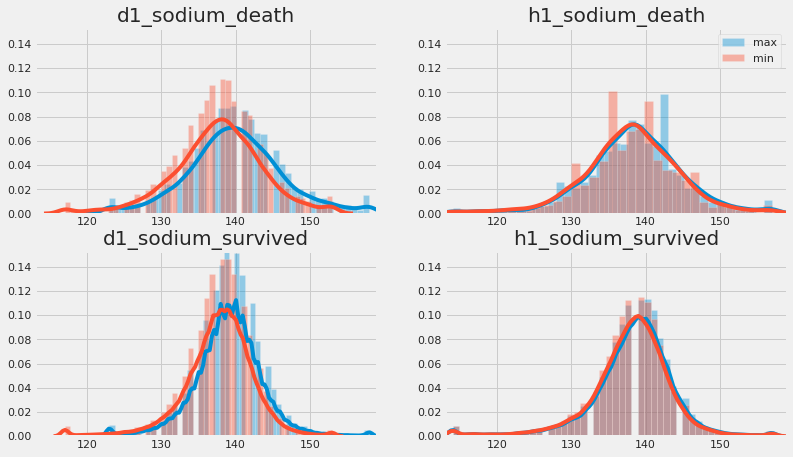

In [0]:
sodium=['d1_sodium_max','d1_sodium_min','h1_sodium_max','h1_sodium_min']
plot_by_target(sodium)

##### sodium_apache
* sodium_apache: The sodium concentration measured during the first 24 hours which results in the highest APACHE III score

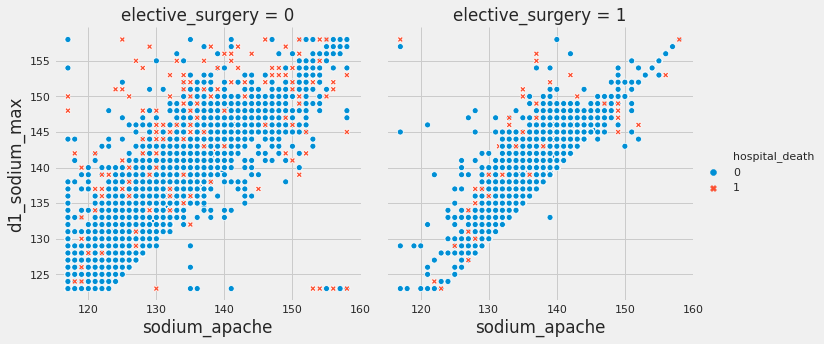

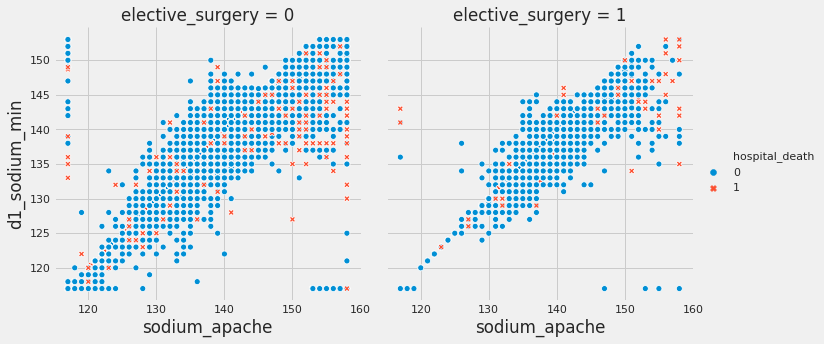

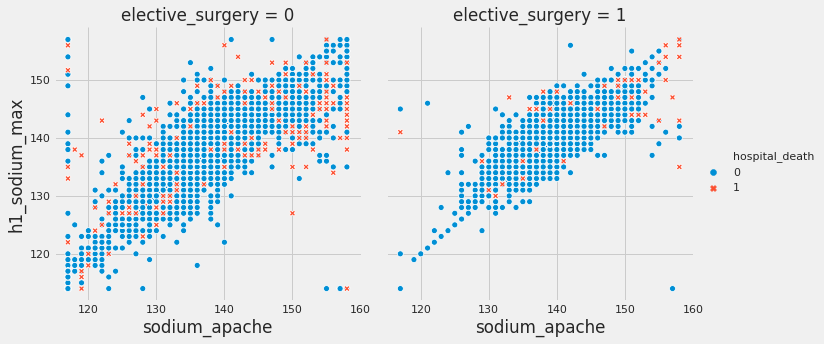

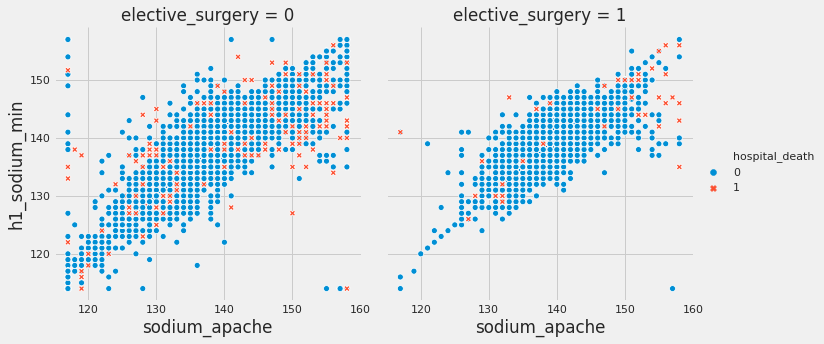

In [0]:
for i in sodium:
  sns.relplot(x="sodium_apache", y=i, col = "elective_surgery",hue="hospital_death", style="hospital_death",kind="scatter", data=df)

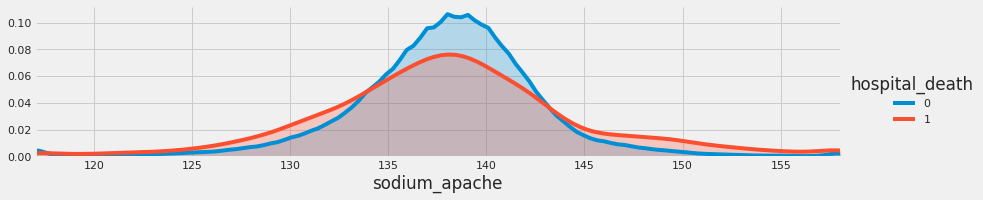

In [0]:
plot_distribution(df,var="sodium_apache", target="hospital_death")

___
#### wbc
___

In [0]:
df[wbc].describe()

,d1_wbc_max,d1_wbc_min,h1_wbc_max,h1_wbc_min
count,78539.0,78539.0,15760.0,15760.0
mean,12.5,11.3,13.5,13.4
std,6.8,6.0,7.0,7.0
min,1.2,0.9,1.1,1.1
25%,8.0,7.4,8.6,8.6
50%,11.0,10.1,12.1,12.1
75%,15.2,13.7,16.8,16.7
max,46.1,40.9,44.1,44.1


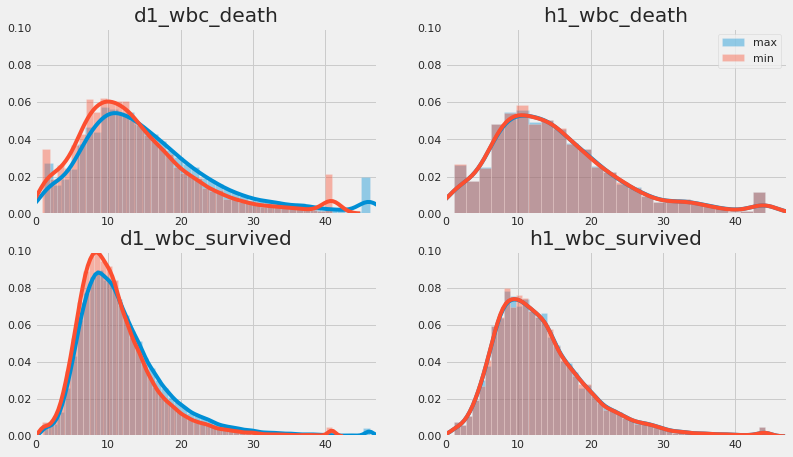

In [0]:
wbc=['d1_wbc_max','d1_wbc_min','h1_wbc_max','h1_wbc_min']
plot_by_target(wbc)

##### wcb_apache
* wbc_apache: The white blood cell count measured during the first 24 hours which results in the highest APACHE III score

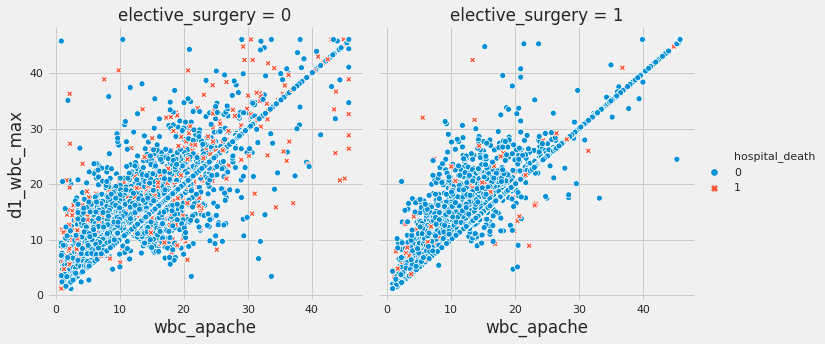

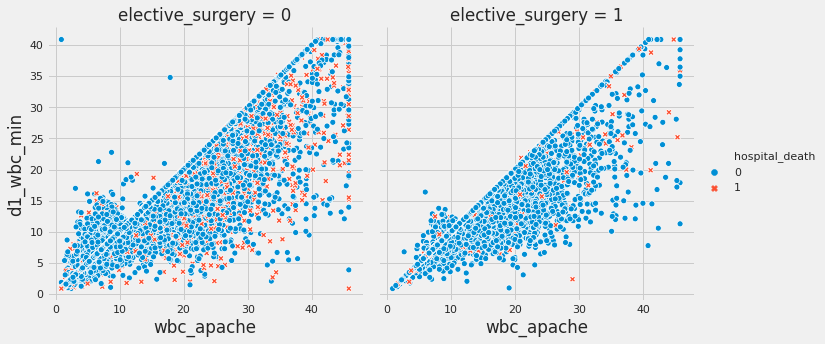

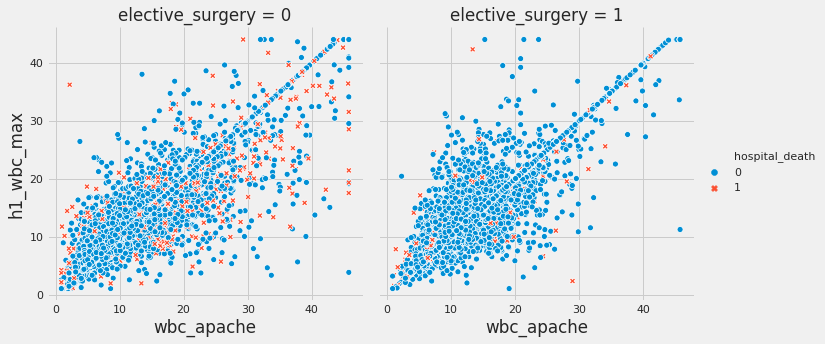

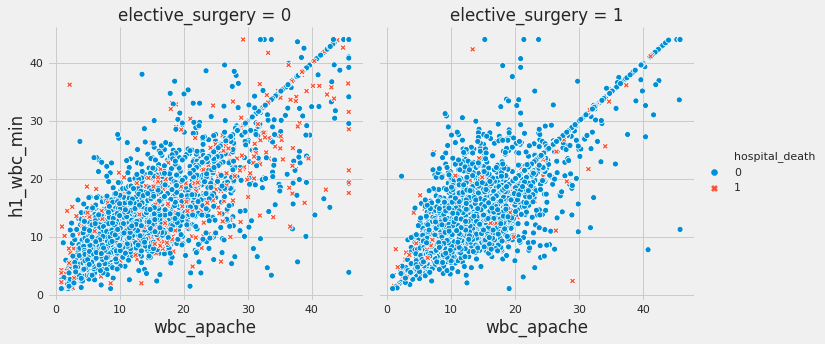

In [0]:
for i in wbc:
  sns.relplot(x="wbc_apache", y=i, col = "elective_surgery",hue="hospital_death", style="hospital_death",kind="scatter", data=df)

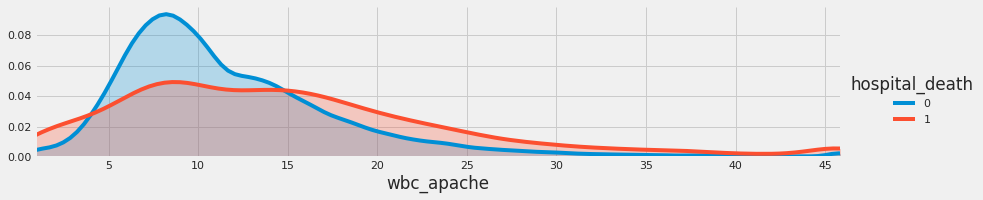

In [0]:
plot_distribution(df,var="wbc_apache", target="hospital_death")

___
#### pco2
___

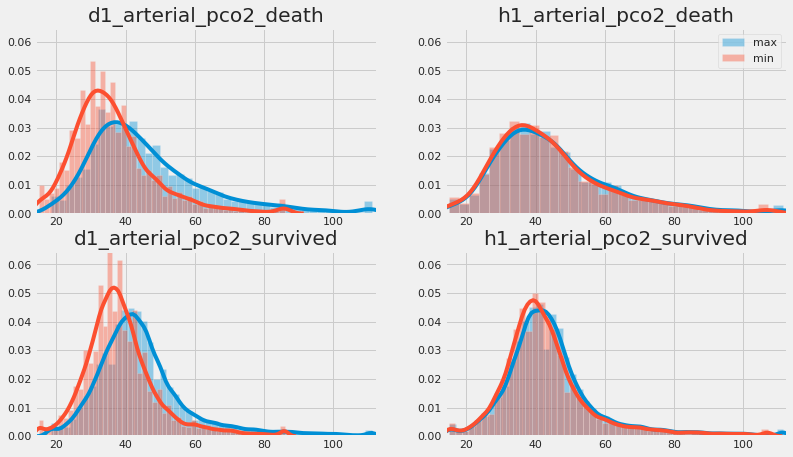

In [0]:
pco2 = ['d1_arterial_pco2_max', 'd1_arterial_pco2_min','h1_arterial_pco2_max', 'h1_arterial_pco2_min' ]
plot_by_target(pco2)

___
##### paco2_apche

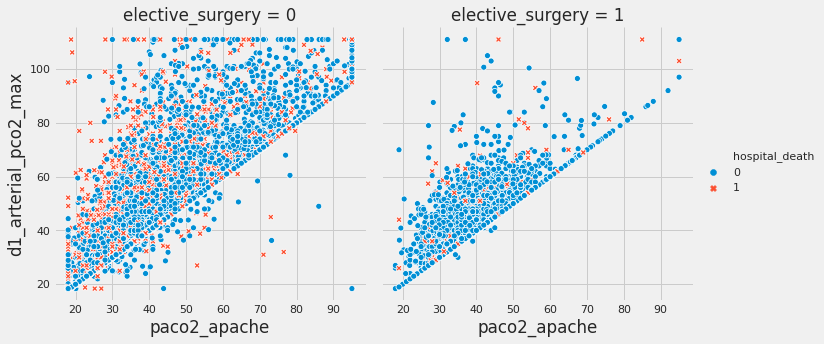

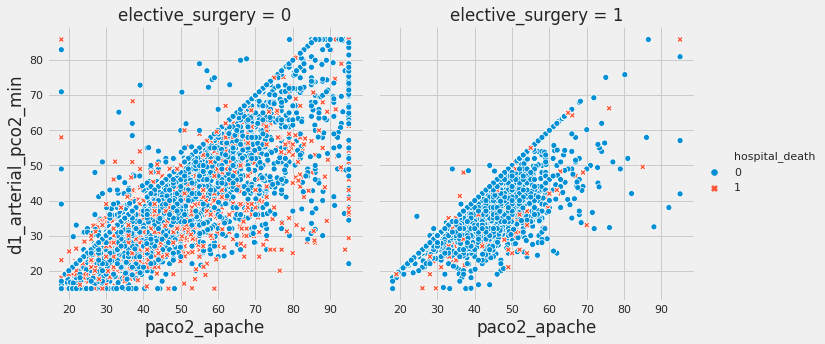

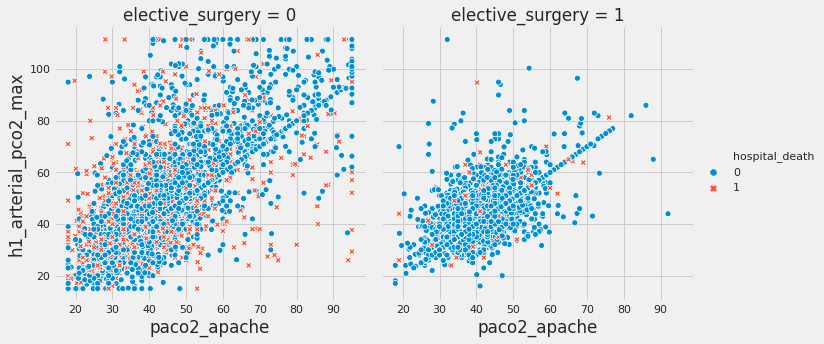

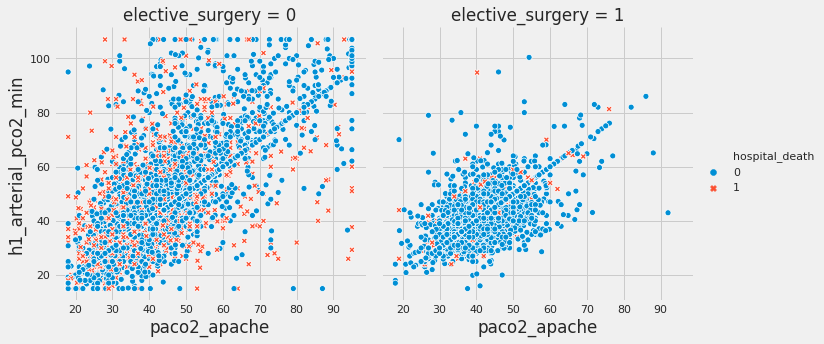

In [0]:
for i in pco2:
  sns.relplot(x="paco2_apache", y=i, col = "elective_surgery",hue="hospital_death", style="hospital_death",kind="scatter", data=df)

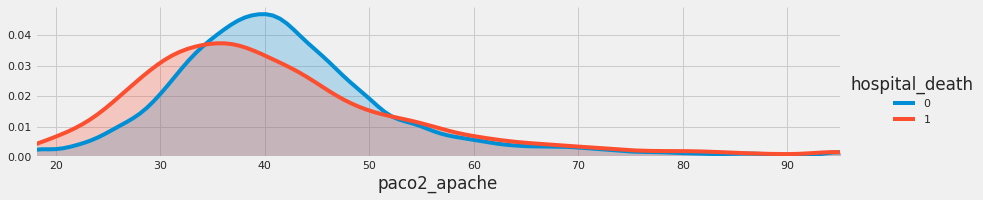

In [0]:
plot_distribution(df,var="paco2_apache", target="hospital_death")

___
#### arterial ph
The normal arterial blood pH range is between 7.36 and 7.44 ([H+] between 44 and 36 nEq/L). Acidemia is defined as an arterial pH <7.36 ([H+] >44 nEq/L) and may result from a primary elevation in pCO2, a fall in [HCO3−], or both.

ph_apache : 
 - Missing value: 77.3%
 - The pH from the arterial blood gas taken during the first 24 hours of unit admission which produces the highest APACHE III score for acid-base disturbance
___

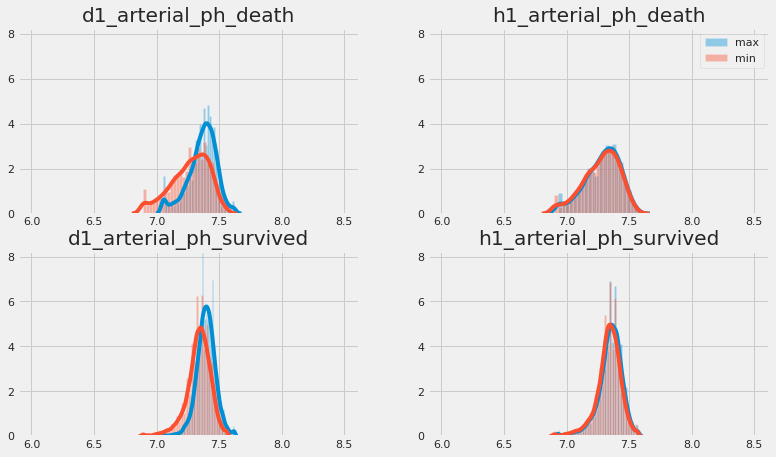

In [0]:
ph =['d1_arterial_ph_max', 'd1_arterial_ph_min', 'h1_arterial_ph_max', 'h1_arterial_ph_min']
plot_by_target(ph)

###### ph_apache

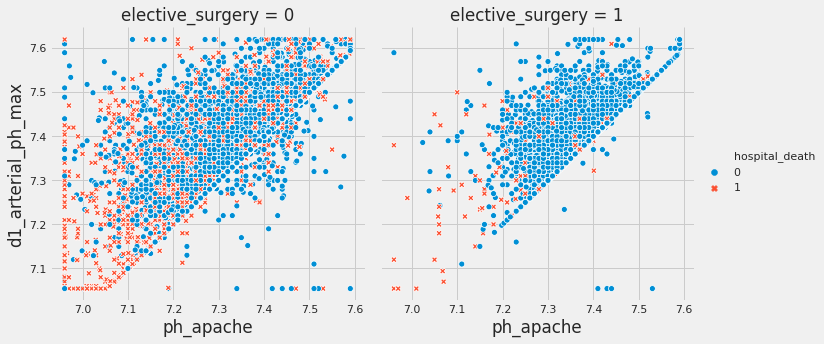

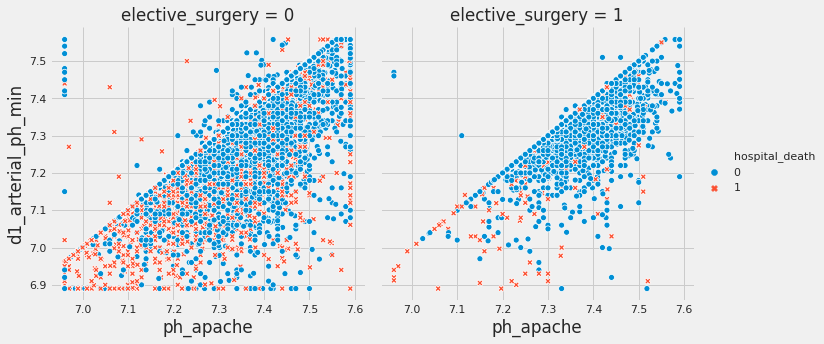

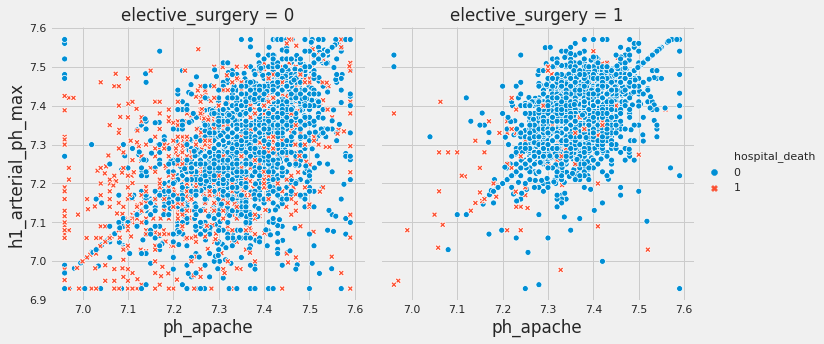

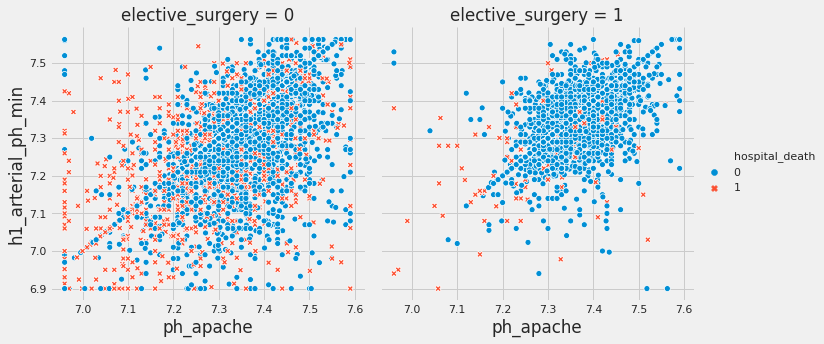

In [0]:
for i in ph:
  sns.relplot(x="ph_apache", y=i, col ="elective_surgery", hue="hospital_death", style="hospital_death",kind="scatter", data=df)

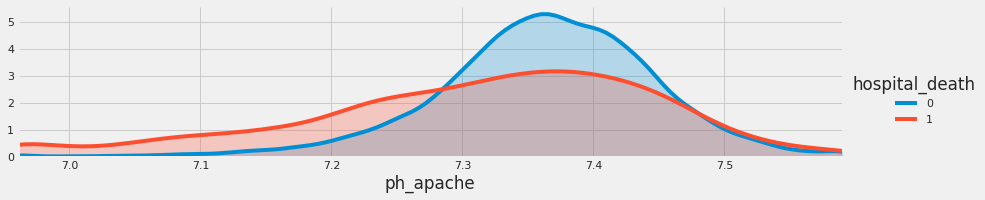

In [0]:
plot_distribution(df,var="ph_apache", target="hospital_death")

___
#### po2
___

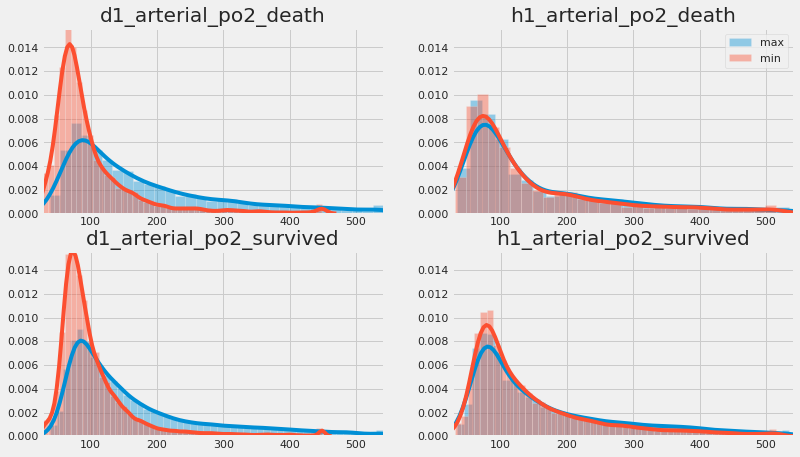

In [0]:
po2 =['d1_arterial_po2_max', 'd1_arterial_po2_min', 'h1_arterial_po2_max', 'h1_arterial_po2_min']
plot_by_target(po2)

##### pao2_apache

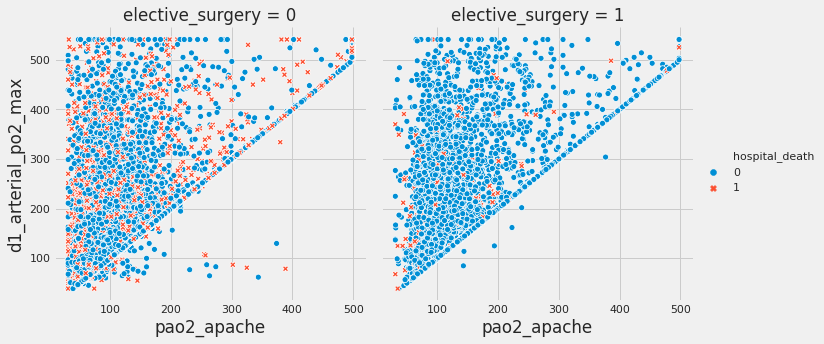

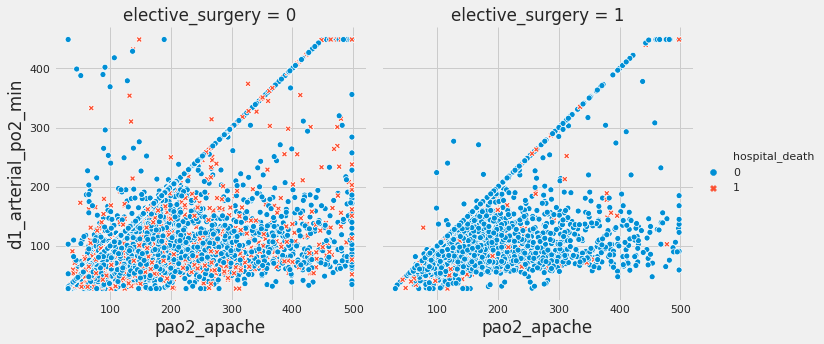

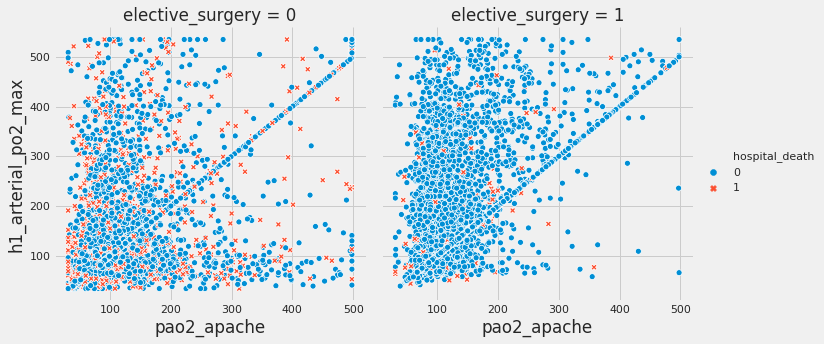

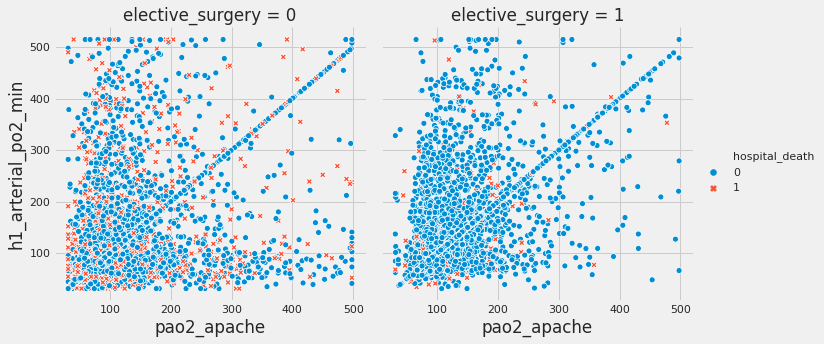

In [0]:
for i in po2:
  sns.relplot(x="pao2_apache", y=i, col ="elective_surgery", hue="hospital_death", style="hospital_death",kind="scatter", data=df)

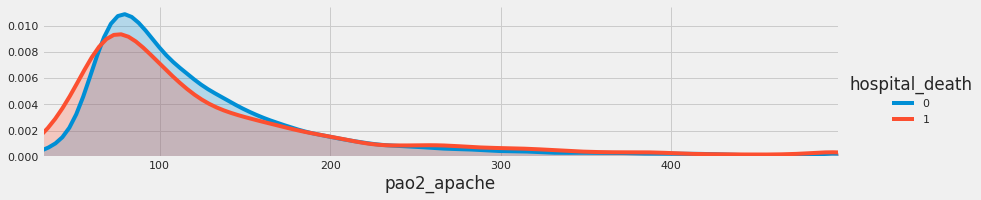

In [0]:
plot_distribution(df,var="pao2_apache", target="hospital_death")

___
#### pao2fio2ratio
___

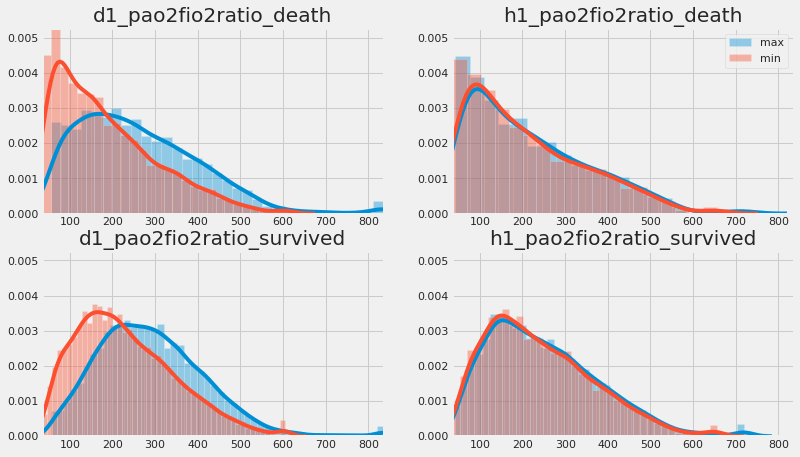

In [0]:
pao2fio2ratio=['d1_pao2fio2ratio_max','d1_pao2fio2ratio_min','h1_pao2fio2ratio_max','h1_pao2fio2ratio_min']
plot_by_target(pao2fio2ratio)

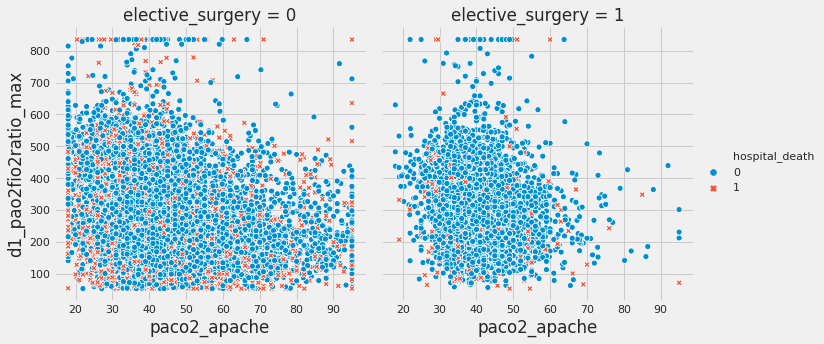

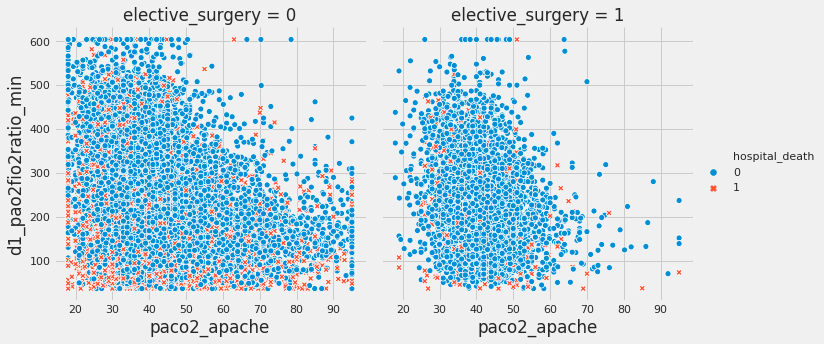

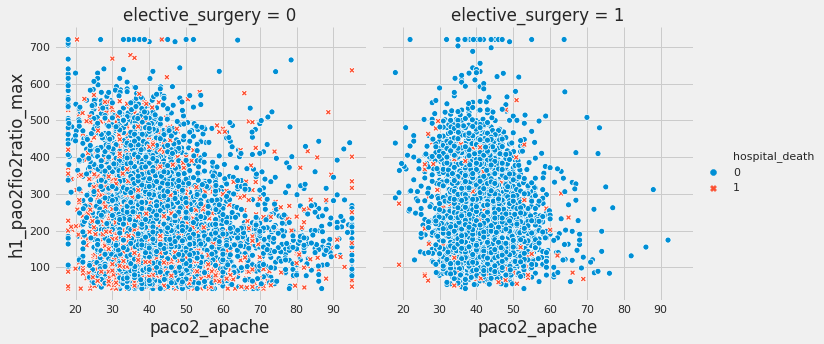

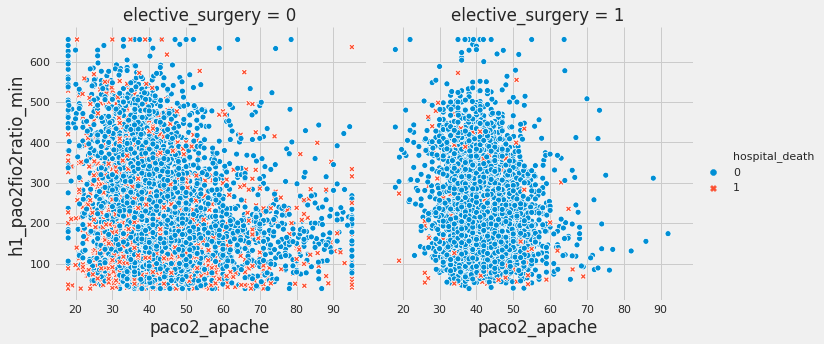

In [0]:
for i in pao2fio2ratio:
  sns.relplot(x="paco2_apache", y=i, col ="elective_surgery", hue="hospital_death", style="hospital_death",kind="scatter", data=df)

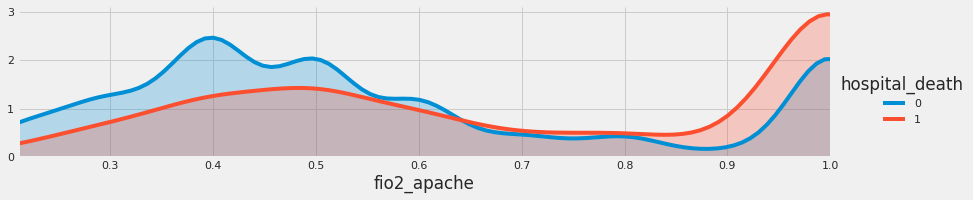

In [0]:
plot_distribution(df,var="fio2_apache", target="hospital_death")